# 4B — All-data BRUM-style 3DGS training

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## 1. Configuration

In [ ]:
from pathlib import Path
import os, sys, json, shutil, subprocess, textwrap, math, glob, random
import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt

DRIVE_ROOT = Path('/content/drive/MyDrive')
PROJECT_ROOT = DRIVE_ROOT / 'ResearchProject'

CAR_ID_INPUT = '26004751'
CAR_ID = CAR_ID_INPUT if str(CAR_ID_INPUT).startswith('car_') else f'car_{CAR_ID_INPUT}'


DUST3R_OUTPUT_ROOT = PROJECT_ROOT / 'dust3r_outputs_batch_strict_singlecar_method_v1'
CAR_DIR = DUST3R_OUTPUT_ROOT / CAR_ID
BRUM_PKG = CAR_DIR / 'brum_ready_scene.pt'

NOVEL_ROOT = CAR_DIR / 'novel_views_brum_strict_v7_slerp_depth'
NOVEL_META = NOVEL_ROOT / 'novel_views_manifest.json'
NOVEL_BRUM_META = NOVEL_ROOT / 'novel_views_brum_manifest.json'
NOVEL_OBJECT_META = NOVEL_ROOT / 'novel_views_object_manifest.json'
NOVEL_CSV = NOVEL_ROOT / 'novel_view_summary.csv'
NOVEL_CONFIG = NOVEL_ROOT / 'augmentation_config_brum_strict_v7_slerp_depth.json'

GS_REPO = PROJECT_ROOT / 'gaussian-splatting'
GS_BRUM_ROOT = PROJECT_ROOT / 'gs_outputs_brum_strict_v7_slerp_depth'
SCENE_ROOT = GS_BRUM_ROOT / CAR_ID / 'scene_graphdeco_brum_strict_v7_slerp_depth'
SCRIPT_DIR = GS_BRUM_ROOT / 'scripts'
SCRIPT_DIR.mkdir(parents=True, exist_ok=True)
TRAIN_SCRIPT = SCRIPT_DIR / 'train_brum_strict_v7.py'

MODEL_ROOT = GS_BRUM_ROOT / CAR_ID / 'model_brum_strict_v7_ALLDATA_BRUMLOSS'
EVAL_ROOT = GS_BRUM_ROOT / CAR_ID / 'eval_brum_strict_v7_ALLDATA_BRUMLOSS'
DIAG_ROOT = EVAL_ROOT / 'diagnostics'
DIAG_ROOT.mkdir(parents=True, exist_ok=True)

ITERATIONS = 5000
SH_DEGREE = 3
MAX_INIT_POINTS = 250000


BRUM_LAMBDA_GEN = 1.0
BRUM_GEN_EVERY = 1
USE_GENERATED_WEIGHT = True

USE_REAL_MASKED_LOSS = False

WHITE_BACKGROUND = False
RANDOM_BACKGROUND = False

OVERWRITE_SCENE = True
OVERWRITE_MODEL = True

MAX_GENERATED_H = 0.08
MIN_TRAIN_MASK_PIXELS = 500

BRUM_W, BRUM_H = 512, 256
BRUM_K = np.array([[512., 0., 256.],
                   [0., 512., 128.],
                   [0.,   0.,   1.]], dtype=np.float64)

EXPECTED_AUG_SCHEMA = 'BRUM_STRICT_AUGMENTATION_V7_SLERP_DEPTH'
EXPECTED_POSE_INTERPOLATION = 'translation_linear_rotation_slerp'
EXPECTED_RENDERING_MODE = 'depth_aware_zbuffer_splatting'

STALE_TOKENS_FORBIDDEN_IN_OUTPUTS = [
    'novel_views_brum_strict_v6',
    'gs_outputs_brum_strict_v6',
    'paper_equivalent',
    'real_unmasked',
    'SMOKE'
]

print('CAR_ID           :', CAR_ID)
print('BRUM_PKG         :', BRUM_PKG, BRUM_PKG.exists())
print('NOVEL_META       :', NOVEL_META, NOVEL_META.exists())
print('NOVEL_CONFIG     :', NOVEL_CONFIG, NOVEL_CONFIG.exists())
print('GS_REPO          :', GS_REPO, GS_REPO.exists())
print('SCENE_ROOT       :', SCENE_ROOT)
print('MODEL_ROOT       :', MODEL_ROOT)
print('EVAL_ROOT        :', EVAL_ROOT)
print('ITERATIONS       :', ITERATIONS)
print('Training mode     : all 8 real views + all generated views; no held-out test data')
print('Generated loss   : BRUM selective masked weighted L1 only; no generated SSIM/DSSIM')

def assert_strict_4b_paths():
    expected_root = 'dust3r_outputs_batch_strict_singlecar_method_v1'
    expected_aug = 'novel_views_brum_strict_v7_slerp_depth'
    for p in [DUST3R_OUTPUT_ROOT, CAR_DIR, BRUM_PKG, NOVEL_ROOT, NOVEL_META]:
        ps = str(p)
        assert expected_root in ps, f'Wrong 2B root: {ps}'
    assert expected_aug in str(NOVEL_ROOT), f'Wrong 3A root: {NOVEL_ROOT}'
    for p in [GS_BRUM_ROOT, SCENE_ROOT, MODEL_ROOT, EVAL_ROOT, TRAIN_SCRIPT]:
        ps = str(p)
        for bad in STALE_TOKENS_FORBIDDEN_IN_OUTPUTS:
            assert bad not in ps, f'Stale token {bad} in output path: {ps}'
    assert BRUM_PKG.exists(), f'Missing 2B package: {BRUM_PKG}'
    assert NOVEL_META.exists(), f'Missing 3A v7 manifest: {NOVEL_META}'
    assert GS_REPO.exists(), f'Missing gaussian-splatting repo: {GS_REPO}'
    print('✅ strict 4B paths pass: 2B strict package + 3A v7 SLERP/depth outputs')

assert_strict_4b_paths()


CAR_ID           : car_26004751
BRUM_PKG         : /content/drive/MyDrive/ResearchProject/dust3r_outputs_batch_strict_singlecar_method_v1/car_26004751/brum_ready_scene.pt True
NOVEL_META       : /content/drive/MyDrive/ResearchProject/dust3r_outputs_batch_strict_singlecar_method_v1/car_26004751/novel_views_brum_strict_v7_slerp_depth/novel_views_manifest.json True
NOVEL_CONFIG     : /content/drive/MyDrive/ResearchProject/dust3r_outputs_batch_strict_singlecar_method_v1/car_26004751/novel_views_brum_strict_v7_slerp_depth/augmentation_config_brum_strict_v7_slerp_depth.json True
GS_REPO          : /content/drive/MyDrive/ResearchProject/gaussian-splatting True
SCENE_ROOT       : /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/scene_graphdeco_brum_strict_v7_slerp_depth
MODEL_ROOT       : /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/model_brum_strict_v7_ALLDATA_BRUMLOSS
EVAL_ROOT        : /content/drive/MyDri

## 2. Install/check GraphDECO dependencies

In [3]:

!pip install -q plyfile tqdm opencv-python imageio imageio-ffmpeg scikit-image lpips ninja

import os, sys, subprocess, shutil
from pathlib import Path
import torch

torch_lib = Path(torch.__file__).parent / 'lib'
cuda_lib = Path('/usr/local/cuda/lib64')
os.environ['LD_LIBRARY_PATH'] = f'{torch_lib}:{cuda_lib}:' + os.environ.get('LD_LIBRARY_PATH','')
os.environ['LIBRARY_PATH'] = f'{torch_lib}:{cuda_lib}:' + os.environ.get('LIBRARY_PATH','')
os.environ['TORCH_CUDA_ARCH_LIST'] = '7.5;8.0;8.6;8.9;9.0'

if str(GS_REPO) not in sys.path:
    sys.path.insert(0, str(GS_REPO))
os.environ['PYTHONPATH'] = str(GS_REPO) + ':' + os.environ.get('PYTHONPATH','')

print('Torch:', torch.__version__)
print('CUDA available:', torch.cuda.is_available())
print('Torch lib:', torch_lib)


LOCAL_GS_REPO = Path('/content/gaussian-splatting_local')
if not LOCAL_GS_REPO.exists():
    shutil.copytree(GS_REPO, LOCAL_GS_REPO, ignore=shutil.ignore_patterns('output', '*.ply', '__pycache__'))
print('LOCAL_GS_REPO:', LOCAL_GS_REPO)

def install_cuda_submodule(module_name, subdir, import_test):
    try:
        exec(import_test, globals(), globals())
        print(f'✅ {module_name} already importable')
        return
    except Exception as e:
        print(f'Installing {module_name}; previous import failed with: {repr(e)}')
    path = LOCAL_GS_REPO / 'submodules' / subdir
    assert path.exists(), f'Missing submodule: {path}. Run git submodule update --init --recursive in {GS_REPO}'
    cmd = [sys.executable, '-m', 'pip', 'install', str(path), '--no-build-isolation', '--verbose']
    print(' '.join(map(str, cmd)))
    r = subprocess.run(cmd, cwd=str(path), text=True, stdout=subprocess.PIPE, stderr=subprocess.STDOUT)
    print(r.stdout)
    if r.returncode != 0:
        raise RuntimeError(f'{module_name} install failed with code {r.returncode}')
    exec(import_test, globals(), globals())
    print(f'✅ {module_name} OK')

install_cuda_submodule('simple_knn', 'simple-knn', 'from simple_knn._C import distCUDA2')
install_cuda_submodule('diff_gaussian_rasterization', 'diff-gaussian-rasterization', 'from diff_gaussian_rasterization import GaussianRasterizationSettings, GaussianRasterizer')


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.3/43.3 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.8/53.8 kB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 180.7/180.7 kB 14.9 MB/s eta 0:00:00
Torch: 2.10.0+cu128
CUDA available: True
Torch lib: /usr/local/lib/python3.12/dist-packages/torch/lib
LOCAL_GS_REPO: /content/gaussian-splatting_local
Installing simple_knn; previous import failed with: ModuleNotFoundError("No module named 'simple_knn'")
/usr/bin/python3 -m pip install /content/gaussian-splatting_local/submodules/simple-knn --no-build-isolation --verbose
Using pip 24.1.2 from /usr/local/lib/python3.12/dist-packages/pip (python 3.12)
Processing /content/gaussian-splatting_local/submodules/simple-knn
  Preparing metadata (setup.py): started
  Running command python setup.py egg_info
  running egg_info
  creating /tmp/pip-pip-egg-info-75dhm9w_/simple_knn.egg-info
  writing /tmp/pip-pip-egg-info-75dhm9w_/simple_knn.egg-info/PKG-INFO
  wri

## 3. Build GraphDECO scene: real images segmentation-filtered full canvas, generated masks kept for augmented loss

In [4]:
import torch

def to_numpy(x, dtype=np.float64):
    if torch.is_tensor(x):
        x = x.detach().cpu().numpy()
    return np.asarray(x, dtype=dtype)

def qvec_from_rotmat(R):
    R = np.asarray(R, dtype=np.float64)
    Kq = np.array([
        [R[0,0]-R[1,1]-R[2,2], 0, 0, 0],
        [R[1,0]+R[0,1], R[1,1]-R[0,0]-R[2,2], 0, 0],
        [R[2,0]+R[0,2], R[2,1]+R[1,2], R[2,2]-R[0,0], 0],
        [R[2,1]-R[1,2], R[0,2]-R[2,0], R[1,0]-R[0,1], R[0,0]+R[1,1]+R[2,2]],
    ], dtype=np.float64) / 3.0
    eigvals, eigvecs = np.linalg.eigh(Kq)
    q = eigvecs[[3,0,1,2], np.argmax(eigvals)]
    if q[0] < 0:
        q *= -1
    return q

def ensure_uint8_rgb(arr):
    arr = np.asarray(arr)
    if arr.ndim == 2:
        arr = np.repeat(arr[..., None], 3, axis=-1)
    if arr.shape[-1] == 4:
        arr = arr[..., :3]
    if arr.dtype != np.uint8:
        arr = ((arr * 255) if np.nanmax(arr) <= 1.0 else arr).clip(0, 255).astype(np.uint8)
    return arr

def ensure_mask_u8(mask, size_hw=None):
    m = np.asarray(mask)
    if m.ndim == 3:
        m = m[..., 0]
    m = (m > 0).astype(np.uint8) * 255
    im = Image.fromarray(m)
    if size_hw is not None:
        H, W = size_hw
        if im.size != (W, H):
            im = im.resize((W, H), Image.NEAREST)
    return np.asarray(im)

def generated_mask_stats(mask_path, weight_path=None):
    """
    BRUM generated masks are valid-loss masks, NOT object-only masks.
    White/large masks are allowed.
    """
    m_img = Image.open(mask_path).convert("L")
    m = np.asarray(m_img, dtype=np.float32) / 255.0
    valid = m > 0.5
    valid_frac = float(valid.mean())

    stats = {
        "valid_frac": valid_frac,
        "weight_mean_valid": None,
        "weight_min": None,
        "weight_max": None,
    }

    if weight_path and Path(weight_path).exists():
        w_img = Image.open(weight_path).convert("L")
        if w_img.size != m_img.size:
            w_img = w_img.resize(m_img.size, Image.BILINEAR)
        w = np.asarray(w_img, dtype=np.float32) / 255.0

        stats["weight_min"] = float(w.min())
        stats["weight_max"] = float(w.max())
        stats["weight_mean_valid"] = float(w[valid].mean()) if valid.any() else 0.0

    return stats

def load_generated_records():
    src = NOVEL_BRUM_META if NOVEL_BRUM_META.exists() else (
        NOVEL_OBJECT_META if NOVEL_OBJECT_META.exists() else NOVEL_META
    )
    assert src.exists(), f"Missing generated manifest: {src}"

    records = json.loads(src.read_text())
    clean = []

    for r in records:
        rr = dict(r)

        # BRUM uncertainty / view-quality filter.
        if float(rr.get("h", 999.0)) > MAX_GENERATED_H:
            continue

        # IMPORTANT:
        # train_mask_path is BRUM valid-supervision / XNOR mask.
        train_mask_path = (
            rr.get("train_mask_path")
            or rr.get("xnor_mask_path")
            or rr.get("and_mask_path")
            or rr.get("source_mask_path")
        )
        if not train_mask_path or not Path(train_mask_path).exists():
            continue

        train_weight_path = rr.get("train_weight_path") or rr.get("weight_path")
        if train_weight_path is not None and not Path(train_weight_path).exists():
            train_weight_path = None

        nmask = int(rr.get("n_mask_pixels_train", rr.get("n_mask_pixels_and_support", 0)))
        if nmask < MIN_TRAIN_MASK_PIXELS:
            continue

        stats = generated_mask_stats(train_mask_path, train_weight_path)

        # Only reject truly empty valid-supervision masks.
        # Large valid_frac like 0.95-0.99 is okay for BRUM.
        if stats["valid_frac"] <= 0.001:
            continue

        rr["train_mask_path"] = str(train_mask_path)
        rr["train_weight_path"] = str(train_weight_path) if train_weight_path else None
        rr["train_mask_mode"] = rr.get("train_mask_mode", "brum_valid_loss_mask")

        rr["brum_valid_frac"] = stats["valid_frac"]
        rr["brum_weight_mean_valid"] = stats["weight_mean_valid"]
        rr["brum_weight_min"] = stats["weight_min"]
        rr["brum_weight_max"] = stats["weight_max"]

        clean.append(rr)

    print("Generated records before filtering:", len(records))
    print("Generated records kept for BRUM training:", len(clean))

    if len(clean) == 0:
        raise RuntimeError(
            "No generated BRUM records kept. Check manifest paths, MAX_GENERATED_H, and MIN_TRAIN_MASK_PIXELS."
        )

    vals = np.array([r["brum_valid_frac"] for r in clean], dtype=np.float32)
    print("BRUM valid-mask frac min/med/max:", vals.min(), np.median(vals), vals.max())

    wvals = [
        r["brum_weight_mean_valid"]
        for r in clean
        if r["brum_weight_mean_valid"] is not None
    ]
    if len(wvals):
        wvals = np.array(wvals, dtype=np.float32)
        print("BRUM weight mean(valid) min/med/max:", wvals.min(), np.median(wvals), wvals.max())
        if float(wvals.max()) == 0.0:
            print("WARNING: generated weight maps are all zero. Train with USE_GENERATED_WEIGHT=False.")
    else:
        print("No generated weight paths found. Train with USE_GENERATED_WEIGHT=False or mask-only generated loss.")

    return clean, src


assert BRUM_PKG.exists(), f"Missing {BRUM_PKG}. Run 2B strict first."
pkg = torch.load(BRUM_PKG, map_location="cpu", weights_only=False)

required_pkg = [
    "views", "image_paths", "images", "masks", "K_list", "P_list",
    "image_sizes_wh", "global_xyz_multiview", "confs",
    "brum_canvas_wh", "brum_real_confidence_gamma", "shared_K"
]
missing = [k for k in required_pkg if k not in pkg]
if missing:
    raise KeyError(f"{BRUM_PKG} missing required keys: {missing}")

views = list(pkg["views"])
image_paths = [Path(p) for p in pkg["image_paths"]]
K_list = [to_numpy(k, np.float64) for k in pkg["K_list"]]
P_list = [to_numpy(p, np.float64) for p in pkg["P_list"]]
image_sizes_wh = [tuple(map(int, wh)) for wh in pkg["image_sizes_wh"]]
real_masks = [to_numpy(m, np.float32) for m in pkg["masks"]]
images_pkg = [ensure_uint8_rgb(x) for x in pkg["images"]]

EXPECTED_VIEWS = [
    'front', 'front_left', 'side_left', 'rear_left',
    'rear', 'rear_right', 'side_right', 'front_right'
]
assert views == EXPECTED_VIEWS, f"View order mismatch: {views}"
assert len(views) == 8
assert list(map(int, pkg["brum_canvas_wh"])) == [512, 256], pkg["brum_canvas_wh"]
assert float(pkg["brum_real_confidence_gamma"]) == 1.5
assert np.allclose(np.asarray(pkg["shared_K"], dtype=np.float64), BRUM_K, atol=1e-6)

for i, (K, wh, img, m) in enumerate(zip(K_list, image_sizes_wh, images_pkg, real_masks)):
    assert wh == (BRUM_W, BRUM_H), f"{views[i]} image_sizes_wh={wh}"
    assert img.shape[:2] == (BRUM_H, BRUM_W), f"{views[i]} image shape={img.shape}"
    assert m.shape[:2] == (BRUM_H, BRUM_W), f"{views[i]} mask shape={m.shape}"
    assert np.allclose(K, BRUM_K, atol=1e-6), f"{views[i]} K mismatch: {K}"

print("✅ 2B strict BRUM package strict checks pass")
print("BRUM package background_supervision:", pkg.get("background_supervision", "unknown"))

# Check 3A v7 SLERP/depth-aware augmentation package.
novel_records_all = json.loads(NOVEL_META.read_text())
assert len(novel_records_all) > 0, f"Empty generated manifest: {NOVEL_META}"
assert all(str(r.get("schema_version", "")).startswith("BRUM_STRICT_AUGMENTATION_V7_SLERP_DEPTH") for r in novel_records_all), "Generated records are not 3A v7 SLERP/depth-aware schema"
for r in novel_records_all:
    assert float(r["h"]) <= MAX_GENERATED_H + 1e-9
    assert r.get("generated_loss_policy_for_4B") == "masked_weighted_L1_only_no_generated_SSIM"
    assert np.allclose(np.asarray(r["K"], dtype=np.float64), BRUM_K, atol=1e-6)
    for k in ["image_path", "train_mask_path", "train_weight_path", "P_w2c", "T_c2w"]:
        assert k in r, f"generated record missing {k}"
    # v7-specific outputs from SLERP + depth-aware z-buffer augmentation.
    assert r.get("pose_interpolation") == EXPECTED_POSE_INTERPOLATION, r.get("pose_interpolation")
    assert r.get("rendering_mode") == EXPECTED_RENDERING_MODE, r.get("rendering_mode")
    for k in ["source_depth_path", "full_depth_path", "source_depth_vis_path", "full_depth_vis_path"]:
        assert k in r, f"v7 generated record missing {k}"
        assert Path(r[k]).exists(), r[k]
    assert Path(r["image_path"]).exists(), r["image_path"]
    assert Path(r["train_mask_path"]).exists(), r["train_mask_path"]
    assert Path(r["train_weight_path"]).exists(), r["train_weight_path"]

print("✅ 3A v7 SLERP/depth-aware generated manifest strict checks pass:", len(novel_records_all), "records")

if OVERWRITE_SCENE and SCENE_ROOT.exists():
    shutil.rmtree(SCENE_ROOT)

images_dir = SCENE_ROOT / "images"
real_mask_dir = SCENE_ROOT / "real_object_masks"
diagnostic_mask_dir = SCENE_ROOT / "real_object_masks_for_diagnostics_only"
sparse_dir = SCENE_ROOT / "sparse" / "0"

for d in [images_dir, real_mask_dir, diagnostic_mask_dir, sparse_dir]:
    d.mkdir(parents=True, exist_ok=True)

# Write real images as full-canvas segmentation-filtered images.
# This preserves camera canvas while removing background supervision.
real_image_names = []
real_mask_manifest = {}
for i, p in enumerate(image_paths):
    safe_view = str(views[i]).replace("/", "_")
    name = f"real_{i:02d}_{safe_view}.png"
    dst = images_dir / name
    mask_dst = real_mask_dir / name
    diagnostic_dst = diagnostic_mask_dir / name

    if p.exists():
        img = Image.open(p).convert("RGB")
        arr = np.asarray(img, dtype=np.uint8)
    else:
        arr = images_pkg[i]

    assert arr.shape[:2] == (BRUM_H, BRUM_W), f"{name}: wrong image shape {arr.shape}"

    m = ensure_mask_u8(real_masks[i], (BRUM_H, BRUM_W)) > 0
    assert m.shape == (BRUM_H, BRUM_W)
    assert m.mean() > 0.01, f"{name}: empty real mask"
    Image.fromarray((m.astype(np.uint8) * 255), mode="L").save(mask_dst)
    Image.fromarray((m.astype(np.uint8) * 255), mode="L").save(diagnostic_dst)

    # Black outside foreground because WHITE_BACKGROUND=False.
    arr_masked = np.where(m[..., None], arr, 0).astype(np.uint8)
    Image.fromarray(arr_masked, mode="RGB").save(dst)

    real_image_names.append(name)
    real_mask_manifest[name] = str(mask_dst)
    real_mask_manifest[Path(name).stem] = str(mask_dst)

(SCENE_ROOT / "real_mask_manifest.json").write_text(json.dumps(real_mask_manifest, indent=2))

# cameras.txt
cam_lines = [
    "# Camera list",
    "# CAMERA_ID, MODEL, WIDTH, HEIGHT, PARAMS[]",
    f"# Number of cameras: {len(real_image_names)}",
]
for i, (K, (W, H)) in enumerate(zip(K_list, image_sizes_wh), start=1):
    fx, fy, cx, cy = K[0, 0], K[1, 1], K[0, 2], K[1, 2]
    assert (W, H) == (BRUM_W, BRUM_H)
    cam_lines.append(f"{i} PINHOLE {W} {H} {fx:.12f} {fy:.12f} {cx:.12f} {cy:.12f}")
(sparse_dir / "cameras.txt").write_text("\n".join(cam_lines) + "\n")

# images.txt
img_lines = [
    "# Image list",
    "# IMAGE_ID, QW, QX, QY, QZ, TX, TY, TZ, CAMERA_ID, NAME",
    f"# Number of images: {len(real_image_names)}",
]
for i, (P, name) in enumerate(zip(P_list, real_image_names), start=1):
    q = qvec_from_rotmat(P[:3, :3])
    t = P[:3, 3]
    img_lines.append(
        f"{i} "
        f"{q[0]:.12f} {q[1]:.12f} {q[2]:.12f} {q[3]:.12f} "
        f"{t[0]:.12f} {t[1]:.12f} {t[2]:.12f} "
        f"{i} {name}"
    )
    img_lines.append("")
(sparse_dir / "images.txt").write_text("\n".join(img_lines) + "\n")

# Initial point cloud from DUSt3R global alignment.
xyz = to_numpy(pkg["global_xyz_multiview"], np.float64)
xyz = xyz[np.isfinite(xyz).all(axis=1)]
assert len(xyz) > 0

if len(xyz) > MAX_INIT_POINTS:
    rng = np.random.default_rng(0)
    xyz = xyz[rng.choice(len(xyz), MAX_INIT_POINTS, replace=False)]

print("Initial xyz points used:", len(xyz))
print("xyz min:", xyz.min(axis=0))
print("xyz max:", xyz.max(axis=0))
print("xyz range:", xyz.max(axis=0) - xyz.min(axis=0))

colors = np.full((len(xyz), 3), 180, dtype=np.uint8)
pt_lines = [
    "# 3D point list",
    "# POINT3D_ID, X, Y, Z, R, G, B, ERROR, TRACK[]",
    f"# Number of points: {len(xyz)}",
]
for j, (x, c) in enumerate(zip(xyz, colors), start=1):
    pt_lines.append(
        f"{j} {x[0]:.12f} {x[1]:.12f} {x[2]:.12f} "
        f"{int(c[0])} {int(c[1])} {int(c[2])} 1.0"
    )
(sparse_dir / "points3D.txt").write_text("\n".join(pt_lines) + "\n")

# Copy strict generated manifest into the scene in legacy-compatible names.
clean, manifest_source = load_generated_records()
for r in clean:
    assert Path(r["image_path"]).exists()
    assert Path(r["train_mask_path"]).exists()
    assert r["train_weight_path"] is None or Path(r["train_weight_path"]).exists()
    assert r.get("generated_loss_policy_for_4B") == "masked_weighted_L1_only_no_generated_SSIM"

for fname in [
    "generated_manifest_object_only.json",
    "generated_manifest.json",
    "generated_manifest_brum_soft_weighted.json",
]:
    (SCENE_ROOT / fname).write_text(json.dumps(clean, indent=2))

scene_summary = {
    "schema": "BRUM_STRICT_4B_SCENE_ALLDATA_BRUMLOSS",
    "car_id": CAR_ID,
    "brum_pkg": str(BRUM_PKG),
    "novel_manifest": str(NOVEL_META),
    "real_images": real_image_names,
    "real_mask_manifest": str(SCENE_ROOT / "real_mask_manifest.json"),
    "scene_root": str(SCENE_ROOT),
    "K": BRUM_K.tolist(),
    "canvas_wh": [BRUM_W, BRUM_H],
    "generated_records": len(clean),
    "loss_policy": {
        "real": "standard 3DGS L1 + DSSIM",
        "generated": "BRUM selective masked weighted L1 only; no generated SSIM/DSSIM"
    }
}
(SCENE_ROOT / "brum_strict_all_data_scene_summary.json").write_text(json.dumps(scene_summary, indent=2))

print("Scene:", SCENE_ROOT)
print("Real segmentation-filtered images:", len(real_image_names))
print("Real masks:", len(list(real_mask_dir.glob('*.png'))))
print("Initial DUSt3R points:", len(xyz))
print("Generated manifest source:", manifest_source)
print("Generated records kept:", len(clean))

assert len(real_image_names) == 8, "Expected exactly 8 real cameras."
assert len(xyz) > 1000, "Initial DUSt3R/BRUM point cloud is too small."
assert len(clean) > 0, "No generated records remained after BRUM manifest filtering."

✅ 2B strict BRUM package strict checks pass
BRUM package background_supervision: real images filtered by segmentation mask; generated views use masked weighted supervision
✅ 3A v7 SLERP/depth-aware generated manifest strict checks pass: 64 records


/tmp/ipykernel_724/4161774983.py:247: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  Image.fromarray((m.astype(np.uint8) * 255), mode="L").save(mask_dst)
/tmp/ipykernel_724/4161774983.py:248: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  Image.fromarray((m.astype(np.uint8) * 255), mode="L").save(diagnostic_dst)
/tmp/ipykernel_724/4161774983.py:252: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  Image.fromarray(arr_masked, mode="RGB").save(dst)


Initial xyz points used: 120000
xyz min: [-0.09010787 -0.05356706  0.12567931]
xyz max: [0.12313312 0.05162343 0.35015684]
xyz range: [0.213241   0.10519049 0.22447753]
Generated records before filtering: 64
Generated records kept for BRUM training: 64
BRUM valid-mask frac min/med/max: 0.71162415 0.8550415 0.9634781
BRUM weight mean(valid) min/med/max: 0.4324478 0.5838343 0.8200283
Scene: /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/scene_graphdeco_brum_strict_v7_slerp_depth
Real segmentation-filtered images: 8
Real masks: 8
Initial DUSt3R points: 120000
Generated manifest source: /content/drive/MyDrive/ResearchProject/dust3r_outputs_batch_strict_singlecar_method_v1/car_26004751/novel_views_brum_strict_v7_slerp_depth/novel_views_brum_manifest.json
Generated records kept: 64


In [5]:

# checker
assert SCENE_ROOT.exists()
assert (SCENE_ROOT / "images").exists()
assert (SCENE_ROOT / "sparse" / "0" / "cameras.txt").exists()
assert (SCENE_ROOT / "sparse" / "0" / "images.txt").exists()
assert (SCENE_ROOT / "sparse" / "0" / "points3D.txt").exists()
assert (SCENE_ROOT / "generated_manifest_brum_soft_weighted.json").exists()
assert (SCENE_ROOT / "real_mask_manifest.json").exists()

image_files = sorted((SCENE_ROOT / "images").glob("*.png"))
mask_files = sorted((SCENE_ROOT / "real_object_masks").glob("*.png"))
assert len(image_files) == 8, len(image_files)
assert len(mask_files) == 8, len(mask_files)

for p in image_files:
    im = Image.open(p).convert("RGB")
    assert im.size == (512, 256), f"{p.name}: {im.size}"

gen_records_scene = json.loads((SCENE_ROOT / "generated_manifest_brum_soft_weighted.json").read_text())
assert len(gen_records_scene) > 0
assert all(r.get("generated_loss_policy_for_4B") == "masked_weighted_L1_only_no_generated_SSIM" for r in gen_records_scene)
assert all(np.allclose(np.asarray(r["K"], dtype=np.float64), BRUM_K, atol=1e-6) for r in gen_records_scene)

df_gen_check = pd.DataFrame([{
    "source_view": r.get("source_view"),
    "helper_view": r.get("helper_view"),
    "h": float(r.get("h")),
    "train_weight_frac": float(r.get("train_weight_frac", np.nan)),
    "n_mask_pixels_train": int(r.get("n_mask_pixels_train", 0)),
} for r in gen_records_scene])
display(df_gen_check.describe(include="all"))

print("4B scene package is strict BRUM v6 ready")
print("Real loss: foreground-masked L1 + masked-image DSSIM")
print("Generated loss: masked weighted L1 only; NO generated SSIM")

,source_view,helper_view,h,train_weight_frac,n_mask_pixels_train
count,64,64,64.000000,64.000000,64.000000
unique,8,8,NaN,NaN,NaN
top,front,front_right,NaN,NaN,NaN
freq,8,8,NaN,NaN,NaN
mean,NaN,NaN,0.057500,0.843802,110598.875000
std,NaN,NaN,0.022111,0.072425,9492.842735
min,NaN,NaN,0.025000,0.711624,93274.000000
25%,NaN,NaN,0.043750,0.815134,106841.250000
50%,NaN,NaN,0.062500,0.855042,112072.000000
75%,NaN,NaN,0.076250,0.877710,115043.250000


4B scene package is strict BRUM v6 ready
Real loss: foreground-masked L1 + masked-image DSSIM
Generated loss: masked weighted L1 only; NO generated SSIM


## 4. Visual checks before training

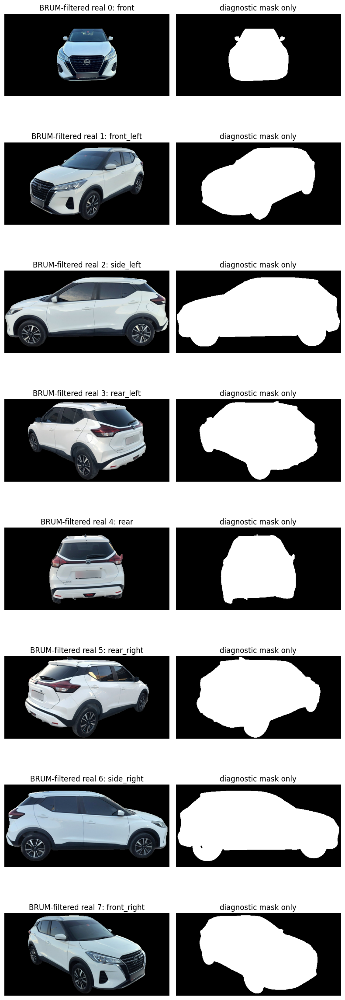

In [6]:

# Original BRUM-filtered inputs and masks
def show_real_inputs(n=None):
    n = len(real_image_names) if n is None else min(n, len(real_image_names))
    fig, axes = plt.subplots(n, 2, figsize=(8, 3*n))
    if n == 1:
        axes = axes[None, :]
    for i in range(n):
        img = Image.open(SCENE_ROOT / 'images' / real_image_names[i]).convert('RGB')
        axes[i,0].imshow(img); axes[i,0].set_title(f'BRUM-filtered real {i}: {views[i]}'); axes[i,0].axis('off')
        mp = SCENE_ROOT / 'real_object_masks_for_diagnostics_only' / real_image_names[i]
        if mp.exists():
            axes[i,1].imshow(Image.open(mp).convert('L'), cmap='gray'); axes[i,1].set_title('diagnostic mask only')
        else:
            axes[i,1].text(0.5, 0.5, 'no mask', ha='center')
        axes[i,1].axis('off')
    plt.tight_layout(); plt.show()

show_real_inputs(n=min(8, len(real_image_names)))


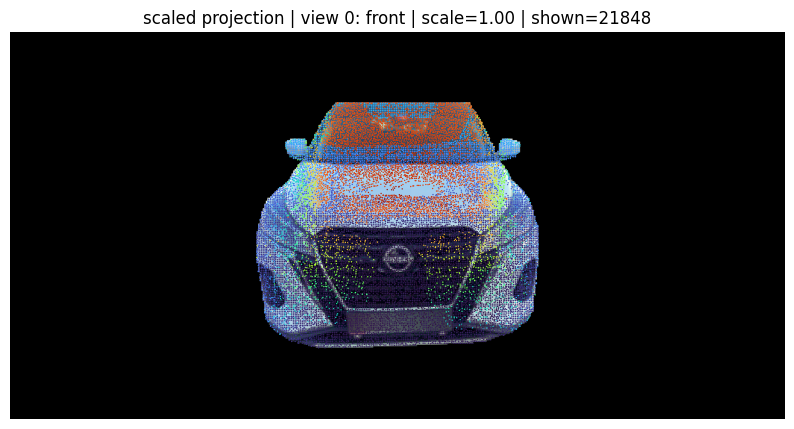

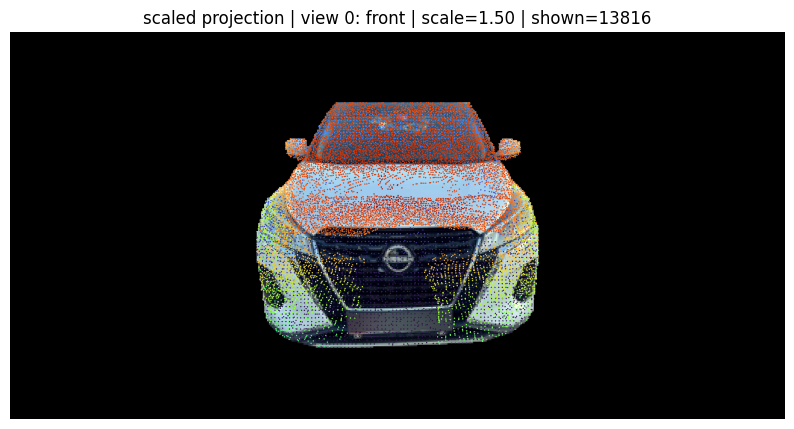

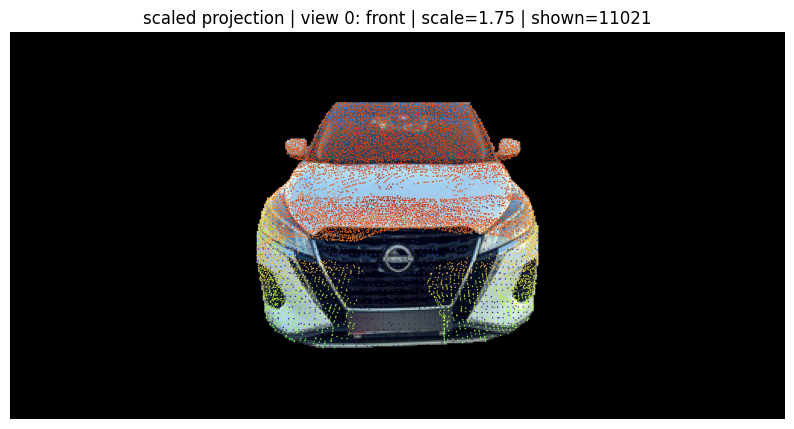

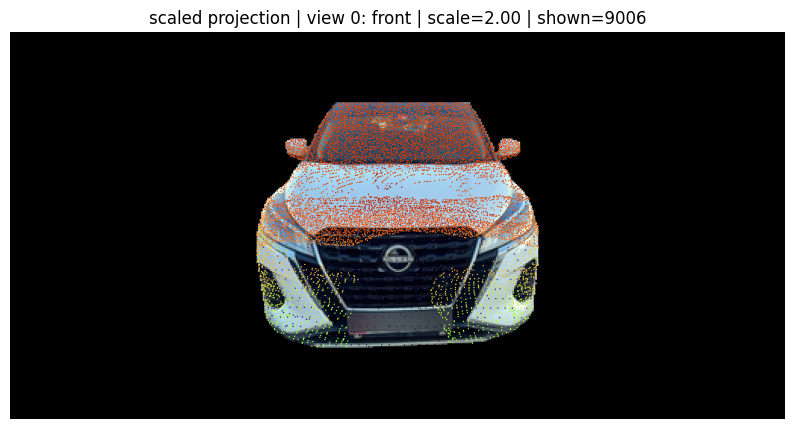

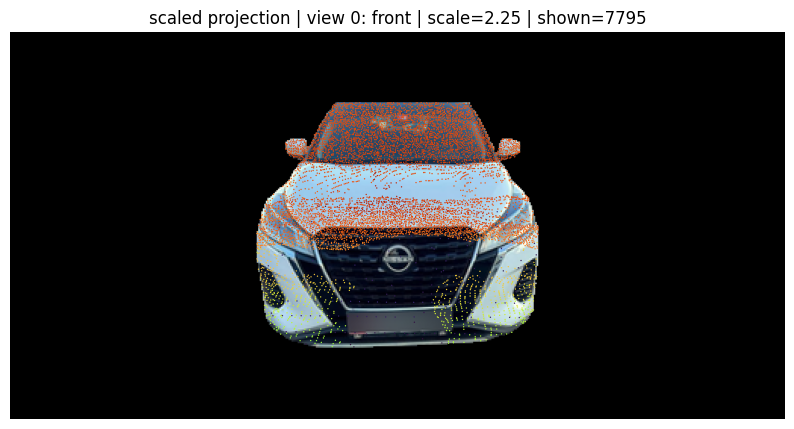

...

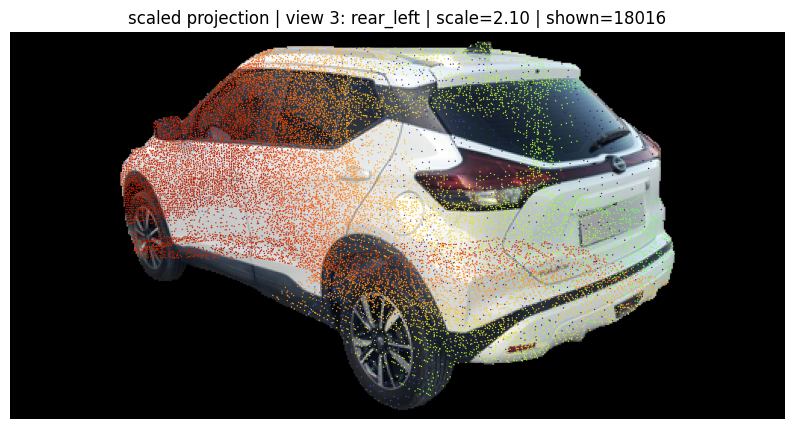

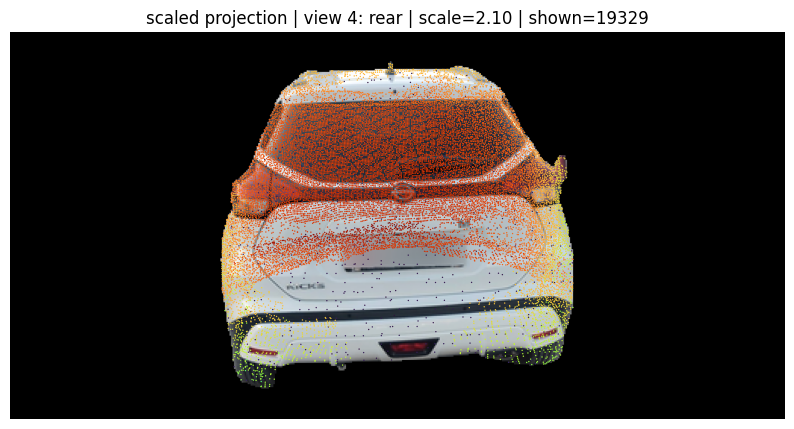

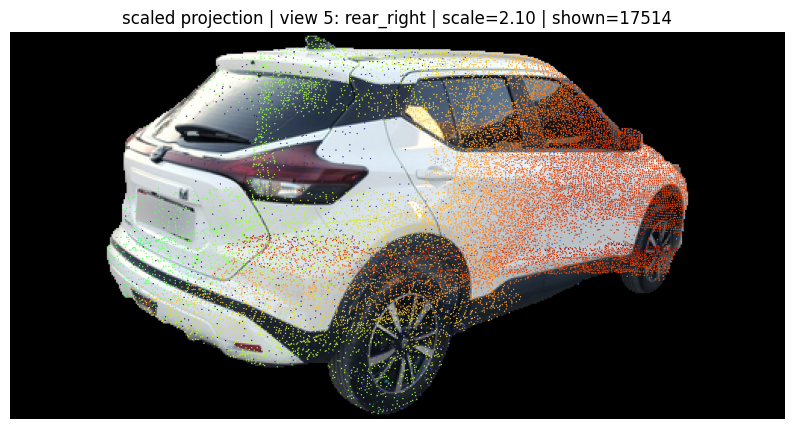

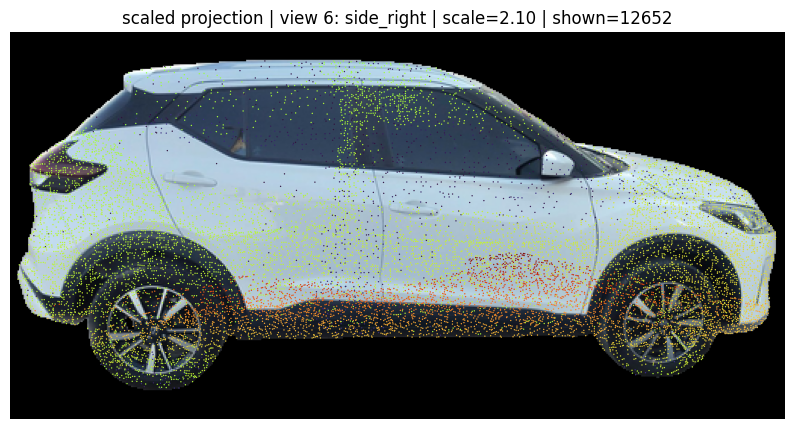

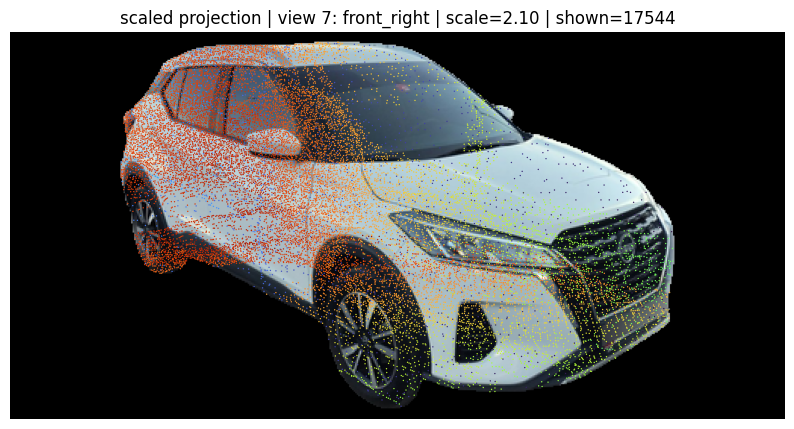

In [7]:
# --- Projection with visual point-cloud scale correction ---

import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path

def make_scaled_xyz_for_visual(scale=2.0):
    pts = np.asarray(xyz, dtype=np.float64)
    pts = pts[np.isfinite(pts).all(axis=1)]
    center = pts.mean(axis=0)
    return center + scale * (pts - center)

def project_points_scaled_on_car(
    img_idx=0,
    scale=2.0,
    max_points=300000,
    point_size=1,
    pixel_stride=1,
    mask_threshold=127,
):
    K = np.asarray(K_list[img_idx], dtype=np.float64)
    P = np.asarray(P_list[img_idx], dtype=np.float64)
    W, H = map(int, image_sizes_wh[img_idx])

    pts_w = make_scaled_xyz_for_visual(scale=scale)

    if len(pts_w) > max_points:
        rng = np.random.default_rng(123)
        pts_w = pts_w[rng.choice(len(pts_w), max_points, replace=False)]

    # world/object -> camera
    pts_c = (P[:3, :3] @ pts_w.T + P[:3, 3:4]).T
    z = pts_c[:, 2]

    front = z > 1e-6
    pts_c = pts_c[front]
    z = z[front]

    uv_h = (K @ pts_c.T).T
    u = uv_h[:, 0] / uv_h[:, 2]
    v = uv_h[:, 1] / uv_h[:, 2]

    inside = (u >= 0) & (u < W) & (v >= 0) & (v < H)
    u, v, z = u[inside], v[inside], z[inside]

    # Optional object-mask filtering for visualization only
    mask_dir = SCENE_ROOT / "real_object_masks_for_diagnostics_only"
    mask_path = mask_dir / real_image_names[img_idx]

    if mask_path.exists():
        mask = Image.open(mask_path).convert("L")
        if mask.size != (W, H):
            mask = mask.resize((W, H), Image.NEAREST)
        mask = np.asarray(mask)

        ui0 = np.clip(np.round(u).astype(int), 0, W - 1)
        vi0 = np.clip(np.round(v).astype(int), 0, H - 1)

        on_object = mask[vi0, ui0] > mask_threshold
        u, v, z = u[on_object], v[on_object], z[on_object]

    # Z-buffer: nearest point per pixel bin
    if len(u) > 0:
        ui = (u / pixel_stride).astype(np.int32)
        vi = (v / pixel_stride).astype(np.int32)
        grid_w = int(np.ceil(W / pixel_stride))
        key = vi * grid_w + ui

        order = np.lexsort((z, key))
        key_sorted = key[order]
        keep_sorted = np.r_[True, key_sorted[1:] != key_sorted[:-1]]
        keep = order[keep_sorted]
    else:
        keep = np.array([], dtype=int)

    img = np.asarray(
        Image.open(SCENE_ROOT / "images" / real_image_names[img_idx]).convert("RGB")
    )

    plt.figure(figsize=(10, 7))
    plt.imshow(img)

    if len(keep) > 0:
        plt.scatter(
            u[keep],
            v[keep],
            c=z[keep],
            s=point_size,
            cmap="turbo",
            alpha=0.95,
            linewidths=0,
        )

    plt.title(
        f"scaled projection | view {img_idx}: {views[img_idx]} | "
        f"scale={scale:.2f} | shown={len(keep)}"
    )
    plt.axis("off")
    plt.show()


# Try several scales on one view first
for s in [1.0, 1.5, 1.75, 2.0, 2.25]:
    project_points_scaled_on_car(
        img_idx=0,
        scale=s,
        point_size=1,
        pixel_stride=1,
    )

# Then inspect all views with the best scale
BEST_VIS_SCALE = 2.1

for idx in range(min(8, len(K_list))):
    project_points_scaled_on_car(
        img_idx=idx,
        scale=BEST_VIS_SCALE,
        point_size=1,
        pixel_stride=1,
    )

Saved: /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/eval_brum_strict_v7_ALLDATA_BRUMLOSS/diagnostics/generated_supervision_slerp_depth_grid.png


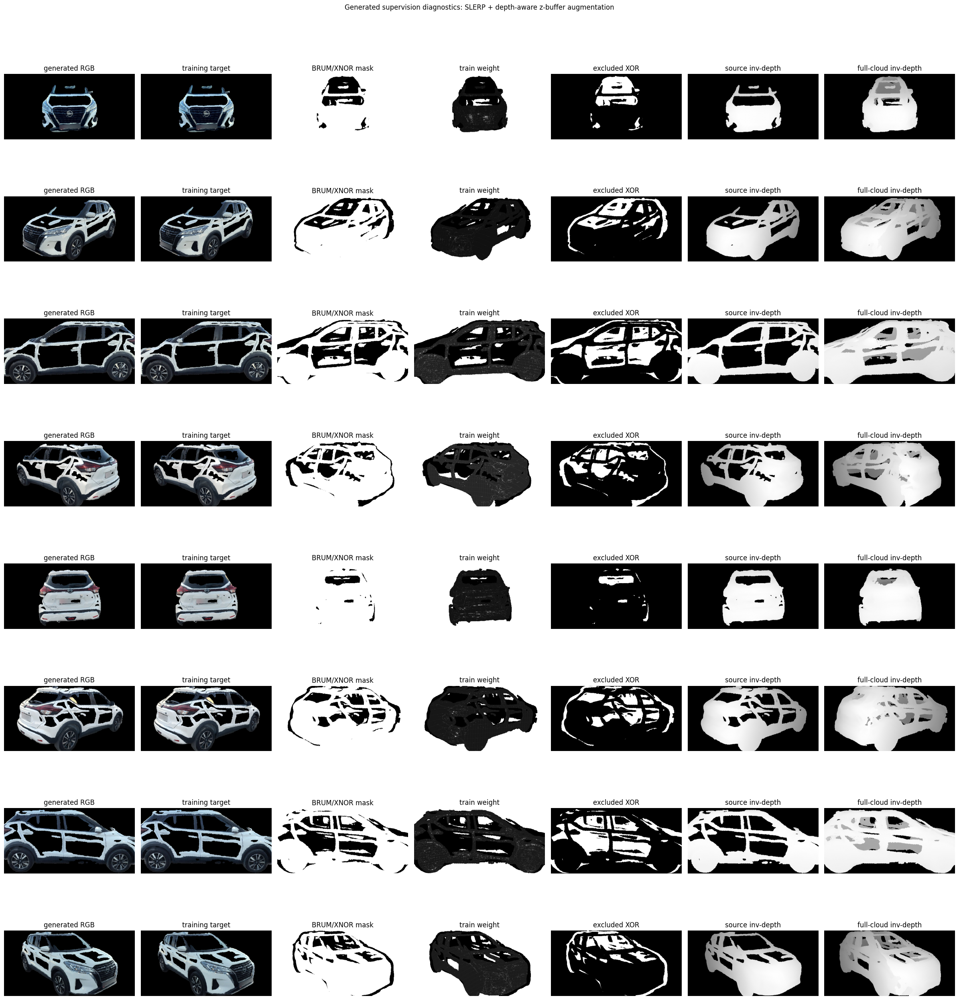

,source_view,helper_view,ring_direction,h,pose_interpolation,rendering_mode,n_projected_points_inside,n_full_cloud_points_inside,train_mask_frac,train_weight_frac,mean_train_weight_positive
0,front,front_right,prev,0.025,translation_linear_rotation_slerp,depth_aware_zbuffer_splatting,14823,302828,0.900864,0.900864,0.818976
1,front,front_right,prev,0.050,translation_linear_rotation_slerp,depth_aware_zbuffer_splatting,14823,302828,0.899498,0.899498,0.815281
2,front,front_right,prev,0.075,translation_linear_rotation_slerp,depth_aware_zbuffer_splatting,14823,302828,0.897827,0.897827,0.817208
3,front,front_right,prev,0.080,translation_linear_rotation_slerp,depth_aware_zbuffer_splatting,14823,302828,0.897514,0.897514,0.810471
4,front,front_left,next,0.025,translation_linear_rotation_slerp,depth_aware_zbuffer_splatting,14823,302828,0.900047,0.900047,0.820406
5,front,front_left,next,0.050,translation_linear_rotation_slerp,depth_aware_zbuffer_splatting,14823,302828,0.897697,0.897697,0.815808
6,front,front_left,next,0.075,translation_linear_rotation_slerp,depth_aware_zbuffer_splatting,14823,302828,0.896126,0.896126,0.813739
7,front,front_left,next,0.080,translation_linear_rotation_slerp,depth_aware_zbuffer_splatting,14823,302828,0.895432,0.895432,0.812250
8,front_left,front,prev,0.025,translation_linear_rotation_slerp,depth_aware_zbuffer_splatting,37129,302828,0.858604,0.858604,0.640393
9,front_left,front,prev,0.050,translation_linear_rotation_slerp,depth_aware_zbuffer_splatting,37129,302828,0.856758,0.856758,0.629346


,count,mean,std,min,25%,50%,75%,max
h,64.0,0.057500,0.022111,0.025000,0.043750,0.062500,0.076250,0.080000
n_projected_points_inside,64.0,37101.359375,9329.515761,14823.000000,35831.000000,41001.500000,42879.750000,44798.000000
n_full_cloud_points_inside,64.0,289412.046875,23295.844524,243494.000000,290217.000000,302743.000000,302828.000000,302828.000000
train_mask_frac,64.0,0.843802,0.072425,0.711624,0.815134,0.855042,0.877710,0.963478
train_weight_frac,64.0,0.843802,0.072425,0.711624,0.815134,0.855042,0.877710,0.963478
mean_train_weight_positive,64.0,0.599061,0.117919,0.433004,0.506986,0.585186,0.664606,0.820406


Generated records: 64


In [8]:
def _load_gray_optional(path):
    if path and Path(path).exists():
        return np.asarray(Image.open(path).convert('L'))
    return None


def _load_depth_vis_from_record(r, key_npy, key_vis):
    # Prefer stored visualization; fall back to inverse-depth rendering from .npy.
    if key_vis in r and Path(r[key_vis]).exists():
        return np.asarray(Image.open(r[key_vis]).convert('L'))
    if key_npy in r and Path(r[key_npy]).exists():
        d = np.load(r[key_npy])
        inv = np.where(np.isfinite(d) & (d > 0), 1.0 / np.maximum(d, 1e-6), 0.0)
        inv = inv - np.nanmin(inv)
        inv = inv / (np.nanmax(inv) + 1e-9)
        return (inv * 255).astype(np.uint8)
    return None


def show_generated_supervision(k=6, save=True):
    records = json.loads((SCENE_ROOT / "generated_manifest_brum_soft_weighted.json").read_text())
    k = min(k, len(records))
    pick = np.linspace(0, len(records) - 1, k, dtype=int)

    fig, axes = plt.subplots(k, 7, figsize=(24, 3.2*k))
    if k == 1:
        axes = axes[None, :]

    for row, ridx in enumerate(pick):
        r = records[int(ridx)]

        clean = Image.open(r.get("clean_image_path", r["image_path"])).convert("RGB")
        train = Image.open(r["image_path"]).convert("RGB")
        mask = Image.open(r["train_mask_path"]).convert("L")
        weight = Image.open(r.get("train_weight_path", r.get("weight_path"))).convert("L")
        inconsistent = _load_gray_optional(r.get('inconsistent_mask_path'))
        source_depth_vis = _load_depth_vis_from_record(r, 'source_depth_path', 'source_depth_vis_path')
        full_depth_vis = _load_depth_vis_from_record(r, 'full_depth_path', 'full_depth_vis_path')

        axes[row, 0].imshow(clean)
        axes[row, 0].set_title("generated RGB")
        axes[row, 1].imshow(train)
        axes[row, 1].set_title("training target")
        axes[row, 2].imshow(mask, cmap="gray")
        axes[row, 2].set_title("BRUM/XNOR mask")
        axes[row, 3].imshow(weight, cmap="gray")
        axes[row, 3].set_title("train weight")
        axes[row, 4].imshow(inconsistent if inconsistent is not None else np.zeros((BRUM_H, BRUM_W)), cmap="gray")
        axes[row, 4].set_title("excluded XOR")
        axes[row, 5].imshow(source_depth_vis if source_depth_vis is not None else np.zeros((BRUM_H, BRUM_W)), cmap="gray")
        axes[row, 5].set_title("source inv-depth")
        axes[row, 6].imshow(full_depth_vis if full_depth_vis is not None else np.zeros((BRUM_H, BRUM_W)), cmap="gray")
        axes[row, 6].set_title("full-cloud inv-depth")

        label = (
            f"{r['source_view']}→{r['helper_view']} h={float(r['h']):.3f}\n"
            f"interp={r.get('pose_interpolation','?')} | render={r.get('rendering_mode','?')}\n"
            f"mask={float(r.get('train_mask_frac', r.get('brum_valid_frac', 0))):.3f}, "
            f"weight={float(r.get('train_weight_frac', 0)):.3f}"
        )
        axes[row, 0].set_ylabel(label, fontsize=8)
        for col in range(7):
            axes[row, col].axis('off')

    plt.suptitle('Generated supervision diagnostics: SLERP + depth-aware z-buffer augmentation', y=1.01)
    plt.tight_layout()
    if save:
        out = DIAG_ROOT / 'generated_supervision_slerp_depth_grid.png'
        fig.savefig(out, dpi=160, bbox_inches='tight')
        print('Saved:', out)
    plt.show()

show_generated_supervision(k=8)

# Aggregate generated-view diagnostics table.
gen_records = json.loads((SCENE_ROOT / "generated_manifest_brum_soft_weighted.json").read_text())
df_gen = pd.DataFrame(gen_records)
cols = [
    'source_view', 'helper_view', 'ring_direction', 'h',
    'pose_interpolation', 'rendering_mode',
    'n_projected_points_inside', 'n_full_cloud_points_inside',
    'train_mask_frac', 'train_weight_frac', 'mean_train_weight_positive',
]
cols = [c for c in cols if c in df_gen.columns]
display(df_gen[cols].head(12))
summary_cols = [c for c in ['h', 'n_projected_points_inside', 'n_full_cloud_points_inside', 'train_mask_frac', 'train_weight_frac', 'mean_train_weight_positive'] if c in df_gen.columns]
display(df_gen[summary_cols].describe().T)
df_gen[cols].to_csv(DIAG_ROOT / 'generated_supervision_manifest_diagnostics.csv', index=False)
print('Generated records:', len(df_gen))


## 5. Write BRUM training script

In [9]:
TRAIN_SCRIPT.write_text(r"""
import os, sys, json, random
from pathlib import Path
from argparse import ArgumentParser
import numpy as np
from PIL import Image
import torch
import torch.nn.functional as F

from arguments import ModelParams, PipelineParams, OptimizationParams
from scene import Scene, GaussianModel
from gaussian_renderer import render, network_gui
from utils.general_utils import safe_state
from utils.graphics_utils import getWorld2View2, getProjectionMatrix, focal2fov
from utils.loss_utils import l1_loss, ssim
from train import prepare_output_and_logger, SPARSE_ADAM_AVAILABLE


def load_u8_rgb(path):
    arr = np.asarray(Image.open(path).convert("RGB"), dtype=np.float32) / 255.0
    return torch.from_numpy(arr).permute(2, 0, 1).contiguous()


def load_gray01(path):
    arr = np.asarray(Image.open(path).convert("L"), dtype=np.float32) / 255.0
    return torch.from_numpy(arr)[None, ...].contiguous()


def resize_mask_like(mask, image, mode="nearest"):
    if mask.shape[-2:] != image.shape[-2:]:
        mask = F.interpolate(
            mask[None],
            size=image.shape[-2:],
            mode=mode,
            align_corners=False if mode == "bilinear" else None,
        )[0]
    return mask


def masked_weighted_l1(rendered, target, mask, weight=None, eps=1e-6, normalize_by_mask=True):
    mask = (mask > 0.5).float()

    if weight is None:
        weight = torch.ones_like(mask)
    else:
        weight = weight.clamp(0.0, 1.0)

    err = torch.abs(rendered - target) * mask * weight

    if normalize_by_mask:
        # BRUM-style generated loss: selective masked weighted L1.
        # The denominator is the valid-mask pixel count, matching this implementation
        # of the BRUM paper objective, not the sum of weights.
        denom = torch.clamp(mask.sum() * rendered.shape[0], min=eps)
    else:
        denom = torch.clamp((mask * weight).sum() * rendered.shape[0], min=eps)

    return err.sum() / denom


def masked_real_loss(rendered, target, mask, lambda_dssim):
    # Real images are foreground-filtered full canvas. Loss is foreground-masked.
    mask = (mask > 0.5).float()
    l1 = masked_weighted_l1(rendered, target, mask, None, normalize_by_mask=True)

    # Masked-image DSSIM: no generated SSIM anywhere; this function is real-only.
    dssim = 1.0 - ssim(rendered * mask, target * mask)
    return (1.0 - float(lambda_dssim)) * l1 + float(lambda_dssim) * dssim


def standard_3dgs_loss(rendered, target, lambda_dssim):
    return (
        (1.0 - float(lambda_dssim)) * l1_loss(rendered, target)
        + float(lambda_dssim) * (1.0 - ssim(rendered, target))
    )


class GeneratedCamera:
    def __init__(self, rec, data_device="cuda"):
        self.uid = int(rec.get("uid", rec.get("source_idx", 0)))
        self.image_name = Path(rec["image_path"]).stem
        self.colmap_id = -1
        self.data_device = data_device

        img = load_u8_rgb(rec["image_path"])
        self.original_image = img.to(data_device)
        self.image_height = int(img.shape[1])
        self.image_width = int(img.shape[2])

        K = np.asarray(rec["K"], dtype=np.float32)
        expected_K = np.array([[512., 0., 256.], [0., 512., 128.], [0., 0., 1.]], dtype=np.float32)
        if not np.allclose(K, expected_K, atol=1e-4):
            raise ValueError(f"Generated K mismatch: {K}")

        fx, fy = float(K[0, 0]), float(K[1, 1])
        self.FoVx = float(focal2fov(fx, self.image_width))
        self.FoVy = float(focal2fov(fy, self.image_height))

        P_w2c = np.asarray(rec["P_w2c"], dtype=np.float32)
        R_w2c = P_w2c[:3, :3]
        t_w2c = P_w2c[:3, 3]

        self.R = R_w2c.T
        self.T = t_w2c

        self.znear = 0.01
        self.zfar = 100.0
        self.trans = np.array([0.0, 0.0, 0.0], dtype=np.float32)
        self.scale = 1.0

        self.world_view_transform = torch.tensor(
            getWorld2View2(self.R, self.T, self.trans, self.scale),
            dtype=torch.float32,
        ).transpose(0, 1).to(data_device)

        self.projection_matrix = getProjectionMatrix(
            znear=self.znear,
            zfar=self.zfar,
            fovX=self.FoVx,
            fovY=self.FoVy,
        ).transpose(0, 1).to(data_device)

        self.full_proj_transform = (
            self.world_view_transform.unsqueeze(0)
            .bmm(self.projection_matrix.unsqueeze(0))
            .squeeze(0)
        )

        self.camera_center = self.world_view_transform.inverse()[3, :3]

        if rec.get("generated_loss_policy_for_4B") != "masked_weighted_L1_only_no_generated_SSIM":
            raise ValueError("Generated record missing strict no-SSIM policy")

        mask_path = (
            rec.get("train_mask_path")
            or rec.get("xnor_mask_path")
            or rec.get("and_mask_path")
            or rec.get("source_mask_path")
        )
        if mask_path is None:
            raise ValueError(f"Generated record has no usable mask path: {rec.keys()}")

        self.brum_mask = resize_mask_like(
            load_gray01(mask_path).to(data_device),
            self.original_image,
            mode="nearest",
        )

        weight_path = rec.get("train_weight_path") or rec.get("weight_path")
        if weight_path and Path(weight_path).exists():
            self.brum_weight = load_gray01(weight_path).to(data_device)
            if self.brum_weight.shape[-2:] != self.original_image.shape[-2:]:
                self.brum_weight = F.interpolate(
                    self.brum_weight[None],
                    size=self.original_image.shape[-2:],
                    mode="bilinear",
                    align_corners=False,
                )[0]
            self.brum_weight = self.brum_weight.clamp(0.0, 1.0)
        else:
            self.brum_weight = torch.ones_like(self.brum_mask)

        if int((self.brum_mask > 0.5).sum().item()) <= 0:
            raise ValueError(f"Empty generated mask: {mask_path}")


def load_generated_cameras(path, data_device="cuda"):
    records = json.loads(Path(path).read_text())
    return [
        GeneratedCamera({**r, "uid": i}, data_device=data_device)
        for i, r in enumerate(records)
    ]


def parse_holdout_indices(s):
    return set(int(x.strip()) for x in str(s).split(",") if x.strip()) if s else set()


def camera_index_from_name(name):
    stem = Path(str(name)).stem
    for p in stem.split("_"):
        if p.isdigit():
            return int(p)
    return None


def load_real_mask_manifest(path):
    if path and Path(path).exists():
        data = json.loads(Path(path).read_text())
        return {str(k): str(v) for k, v in data.items()}
    return {}


def get_real_mask_for_camera(cam, manifest, data_device="cuda"):
    keys = [str(cam.image_name), Path(str(cam.image_name)).stem]
    if not str(cam.image_name).endswith(".png"):
        keys.append(str(cam.image_name) + ".png")
    path = None
    for k in keys:
        if k in manifest:
            path = manifest[k]
            break
    if path is None:
        return None
    m = load_gray01(path).to(data_device)
    return resize_mask_like(m, cam.original_image, mode="nearest")


def train_brum_strict_v7(dataset, opt, pipe, args):
    if (
        not SPARSE_ADAM_AVAILABLE
        and getattr(opt, "optimizer_type", "default") == "sparse_adam"
    ):
        print("Sparse Adam unavailable; using default optimizer.")
        opt.optimizer_type = "default"

    opt.saving_iterations = sorted(
        set([int(x) for x in getattr(opt, "saving_iterations", [])] + [int(opt.iterations)])
    )

    prepare_output_and_logger(dataset)

    try:
        gaussians = GaussianModel(dataset.sh_degree, opt.optimizer_type)
    except TypeError:
        gaussians = GaussianModel(dataset.sh_degree)

    scene = Scene(dataset, gaussians)
    gaussians.training_setup(opt)

    bg = torch.tensor(
        [1, 1, 1] if dataset.white_background else [0, 0, 0],
        dtype=torch.float32,
        device="cuda",
    )

    all_train_cams = scene.getTrainCameras().copy()
    holdout = parse_holdout_indices(args.holdout_indices)

    if holdout:
        all_train_cams = [
            c for c in all_train_cams
            if camera_index_from_name(c.image_name) not in holdout
        ]
        print(f"Held out real indices: {sorted(holdout)} | real train cameras: {len(all_train_cams)}")
    else:
        print(f"Real train cameras: {len(all_train_cams)}")

    if len(all_train_cams) == 0:
        raise RuntimeError("No real train cameras after holdout filtering")

    gen_cams = (
        load_generated_cameras(args.brum_manifest, data_device="cuda")
        if args.brum_manifest
        else []
    )

    real_mask_manifest = load_real_mask_manifest(args.brum_real_mask_manifest)
    real_mask_cache = {}

    print(f"Generated BRUM cameras: {len(gen_cams)}")
    print("Loss policy:")
    if args.brum_use_real_masked_loss:
        print("  real      = foreground-masked L1 + masked-image DSSIM")
    else:
        print("  real      = standard 3DGS L1 + DSSIM")
    print("  generated = masked weighted L1 ONLY; no generated SSIM/DSSIM")
    print(f"  generated_loss_scale={args.brum_lambda_gen} (1.0 = no extra downweight), gen_every={args.brum_gen_every}, use_weight={args.brum_use_weight}")


    if abs(float(args.brum_lambda_gen) - 1.0) > 1e-8:
        print("WARNING: brum_lambda_gen is not 1.0; this is no longer the paper-style unscaled generated term.")

    viewpoint_stack = all_train_cams.copy()
    ema = 0.0
    progress_every = max(1, int(args.progress_every))
    loss_log = []

    for iteration in range(1, int(opt.iterations) + 1):
        if not args.disable_viewer and network_gui.conn is None:
            network_gui.try_connect()

        gaussians.update_learning_rate(iteration)

        if iteration % 1000 == 0:
            gaussians.oneupSHdegree()

        if not viewpoint_stack:
            viewpoint_stack = all_train_cams.copy()

        viewpoint_cam = viewpoint_stack.pop(random.randint(0, len(viewpoint_stack) - 1))
        background = torch.rand((3), device="cuda") if opt.random_background else bg

        render_pkg = render(
            viewpoint_cam,
            gaussians,
            pipe,
            background,
            use_trained_exp=getattr(dataset, "train_test_exp", False),
            separate_sh=SPARSE_ADAM_AVAILABLE,
        )

        image = render_pkg["render"]
        gt = viewpoint_cam.original_image.cuda()

        if args.brum_use_real_masked_loss:
            cname = str(viewpoint_cam.image_name)
            if cname not in real_mask_cache:
                real_mask_cache[cname] = get_real_mask_for_camera(viewpoint_cam, real_mask_manifest, data_device="cuda")
            real_mask = real_mask_cache[cname]
            if real_mask is None:
                real_loss = standard_3dgs_loss(image, gt, getattr(opt, "lambda_dssim", 0.2))
            else:
                real_loss = masked_real_loss(image, gt, real_mask, getattr(opt, "lambda_dssim", 0.2))
        else:
            real_loss = standard_3dgs_loss(image, gt, getattr(opt, "lambda_dssim", 0.2))

        loss = real_loss
        gen_loss = torch.tensor(0.0, device="cuda")

        if gen_cams and args.brum_gen_every > 0 and (iteration % args.brum_gen_every == 0):
            gen_cam = random.choice(gen_cams)

            gen_render = render(
                gen_cam,
                gaussians,
                pipe,
                background,
                use_trained_exp=getattr(dataset, "train_test_exp", False),
                separate_sh=SPARSE_ADAM_AVAILABLE,
            )["render"]

            gen_loss = masked_weighted_l1(
                gen_render,
                gen_cam.original_image,
                gen_cam.brum_mask,
                gen_cam.brum_weight if args.brum_use_weight else None,
                normalize_by_mask=True,
            )

            loss = loss + float(args.brum_lambda_gen) * gen_loss

        loss.backward()

        with torch.no_grad():
            ema = 0.4 * float(loss.item()) + 0.6 * ema

            if iteration % progress_every == 0:
                msg_real = "real_masked" if args.brum_use_real_masked_loss else "real_standard"
                print(
                    f"iter {iteration:06d} | total {ema:.5f} | "
                    f"{msg_real} {real_loss.item():.5f} | "
                    f"gen_weighted_l1_no_ssim {gen_loss.item():.5f}"
                )
                loss_log.append({
                    "iteration": int(iteration),
                    "ema_total_loss": float(ema),
                    "real_loss": float(real_loss.item()),
                    "gen_weighted_l1_no_ssim": float(gen_loss.item()),
                    "lambda_gen": float(args.brum_lambda_gen),
                    "use_real_masked_loss": bool(args.brum_use_real_masked_loss),
                    "use_generated_weight": bool(args.brum_use_weight),
                })

            if iteration in opt.saving_iterations:
                print(f"\n[ITER {iteration}] Saving Gaussians")
                scene.save(iteration)

            if iteration < opt.densify_until_iter:
                gaussians.max_radii2D[render_pkg["visibility_filter"]] = torch.max(
                    gaussians.max_radii2D[render_pkg["visibility_filter"]],
                    render_pkg["radii"][render_pkg["visibility_filter"]],
                )

                gaussians.add_densification_stats(
                    render_pkg["viewspace_points"],
                    render_pkg["visibility_filter"],
                )

                if iteration > opt.densify_from_iter and iteration % opt.densification_interval == 0:
                    size_threshold = 20 if iteration > opt.opacity_reset_interval else None
                    gaussians.densify_and_prune(
                        opt.densify_grad_threshold,
                        0.005,
                        scene.cameras_extent,
                        size_threshold,
                        render_pkg.get("radii", None),
                    )

                if (
                    iteration % opt.opacity_reset_interval == 0
                    or (dataset.white_background and iteration == opt.densify_from_iter)
                ):
                    gaussians.reset_opacity()

            if iteration < opt.iterations:
                gaussians.exposure_optimizer.step()
                gaussians.exposure_optimizer.zero_grad(set_to_none=True)

                if (
                    getattr(opt, "optimizer_type", "default") == "sparse_adam"
                    and SPARSE_ADAM_AVAILABLE
                ):
                    visible = render_pkg["visibility_filter"]
                    gaussians.optimizer.step(visible, render_pkg["radii"].shape[0])
                    gaussians.optimizer.zero_grad(set_to_none=True)
                else:
                    gaussians.optimizer.step()
                    gaussians.optimizer.zero_grad(set_to_none=True)

    if loss_log:
        try:
            import csv
            out_csv = Path(dataset.model_path) / "brum_training_loss_log.csv"
            with out_csv.open("w", newline="") as f:
                writer = csv.DictWriter(f, fieldnames=list(loss_log[0].keys()))
                writer.writeheader()
                writer.writerows(loss_log)
            print("Saved training loss log:", out_csv)
        except Exception as e:
            print("WARNING: could not save loss log:", e)
    print("Training complete.")


if __name__ == "__main__":
    parser = ArgumentParser(
        description="All-data BRUM training: standard real 3DGS loss + generated selective masked weighted L1 only"
    )

    lp = ModelParams(parser)
    op = OptimizationParams(parser)
    pp = PipelineParams(parser)

    parser.add_argument("--ip", type=str, default="127.0.0.1")
    parser.add_argument("--port", type=int, default=6009)
    parser.add_argument("--detect_anomaly", action="store_true", default=False)
    parser.add_argument("--disable_viewer", action="store_true", default=True)
    parser.add_argument("--save_iterations", nargs="+", type=int, default=[])
    parser.add_argument("--test_iterations", nargs="+", type=int, default=[])
    parser.add_argument("--brum_manifest", type=str, required=True)
    parser.add_argument("--brum_real_mask_manifest", type=str, default="")
    parser.add_argument("--brum_lambda_gen", type=float, default=1.0)
    parser.add_argument("--brum_gen_every", type=int, default=1)
    parser.add_argument("--brum_use_weight", action="store_true")
    parser.add_argument("--brum_use_real_masked_loss", action="store_true")
    parser.add_argument("--progress_every", type=int, default=100)
    parser.add_argument("--holdout_indices", type=str, default="")

    args = parser.parse_args(sys.argv[1:])

    if args.iterations not in args.save_iterations:
        args.save_iterations.append(args.iterations)

    print("Optimizing", args.model_path)

    safe_state(False)
    torch.autograd.set_detect_anomaly(args.detect_anomaly)

    opt = op.extract(args)
    opt.saving_iterations = args.save_iterations

    train_brum_strict_v7(lp.extract(args), opt, pp.extract(args), args)
""")

print("Wrote strict v7 training script:", TRAIN_SCRIPT)

Wrote strict v7 training script: /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/scripts/train_brum_strict_v7.py


## 6. Runtime helpers

In [10]:

def run_command(cmd, cwd=GS_REPO, check=True):
    env = os.environ.copy()
    env['PYTHONPATH'] = str(GS_REPO) + ':' + env.get('PYTHONPATH', '')
    print(' '.join(map(str, cmd)))
    r = subprocess.run(cmd, cwd=str(cwd), env=env, text=True, stdout=subprocess.PIPE, stderr=subprocess.STDOUT)
    print(r.stdout)
    if check and r.returncode != 0:
        raise RuntimeError(f'Command failed with code {r.returncode}')
    return r

def find_available_iteration(model_dir):
    its = []
    for p in (Path(model_dir) / 'point_cloud').glob('iteration_*'):
        if (p / 'point_cloud.ply').exists():
            its.append(int(p.name.replace('iteration_', '')))
    if not its:
        raise FileNotFoundError(f'No saved point_cloud.ply under {model_dir}/point_cloud')
    return max(its)

def write_cfg_args(model_dir, scene_root, sh_degree=3, white_background=False, eval_mode=False):
    model_dir = Path(model_dir)
    cfg_path = model_dir / 'cfg_args'
    txt = f'''Namespace(
sh_degree={sh_degree},
source_path='{scene_root}',
model_path='{model_dir}',
images='images',
depths='',
resolution=-1,
white_background={white_background},
train_test_exp=False,
data_device='cuda',
eval={eval_mode}
)'''
    cfg_path.write_text(txt)
    return cfg_path


## 7. All-data generated manifest

No leave-one-out filtering is used. Every real view and every valid generated view is used for training.

In [11]:
# All-data mode: no held-out view and no LOO filtering.
MODEL_ROOT.mkdir(parents=True, exist_ok=True)
EVAL_ROOT.mkdir(parents=True, exist_ok=True)

ALLDATA_SPLIT = {'name': 'all_data_no_test', 'test': []}


def make_all_data_manifest(out_path):
    records = json.loads((SCENE_ROOT / 'generated_manifest_brum_soft_weighted.json').read_text())
    filt = []
    for r in records:
        rr = dict(r)
        rr['train_mask_path'] = rr.get('train_mask_path') or rr.get('xnor_mask_path') or rr.get('and_mask_path') or rr.get('source_mask_path')
        rr['train_weight_path'] = rr.get('train_weight_path') or rr.get('weight_path')

        if not rr.get('train_mask_path') or not Path(rr['train_mask_path']).exists():
            continue
        if not rr.get('train_weight_path') or not Path(rr['train_weight_path']).exists():
            continue
        if float(rr.get('h', 999.0)) > MAX_GENERATED_H:
            continue
        if int(rr.get('n_mask_pixels_train', 0)) < MIN_TRAIN_MASK_PIXELS:
            continue

        # Strict BRUM generated-loss policy for 4B training.
        rr['generated_loss_policy_for_4B'] = 'masked_weighted_L1_only_no_generated_SSIM'
        filt.append(rr)

    out_path.parent.mkdir(parents=True, exist_ok=True)
    out_path.write_text(json.dumps(filt, indent=2))
    print('All-data generated train records:', len(filt), '/', len(records))
    assert len(filt) > 0, 'No generated views left; check 3A manifest/filtering.'
    return out_path

ALLDATA_MANIFEST = make_all_data_manifest(EVAL_ROOT / 'generated_manifest_train_all_data.json')
print('All-data manifest:', ALLDATA_MANIFEST)
print('Real cameras used for training:', len(views))
print('Held-out/test cameras: none')


All-data generated train records: 64 / 64
All-data manifest: /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/eval_brum_strict_v7_ALLDATA_BRUMLOSS/generated_manifest_train_all_data.json
Real cameras used for training: 8
Held-out/test cameras: none


## 8. Train one all-data business-use model

In [12]:
all_runs = []
model_dir = MODEL_ROOT / 'all_data_no_test'
if OVERWRITE_MODEL and model_dir.exists():
    shutil.rmtree(model_dir)
model_dir.mkdir(parents=True, exist_ok=True)

cmd = [
    sys.executable, str(TRAIN_SCRIPT),
    '-s', str(SCENE_ROOT),
    '-m', str(model_dir),
    '--images', 'images',
    '--disable_viewer',
    '--iterations', str(ITERATIONS),
    '--save_iterations', str(ITERATIONS),
    '--sh_degree', str(SH_DEGREE),
    '--brum_manifest', str(ALLDATA_MANIFEST),
    '--brum_real_mask_manifest', str(SCENE_ROOT / 'real_mask_manifest.json'),
    '--brum_lambda_gen', str(BRUM_LAMBDA_GEN),
    '--brum_gen_every', str(BRUM_GEN_EVERY),
    '--progress_every', '100',

]
if WHITE_BACKGROUND:
    cmd.append('--white_background')
if RANDOM_BACKGROUND:
    cmd.append('--random_background')
if USE_GENERATED_WEIGHT:
    cmd.append('--brum_use_weight')
# BRUM applies the standard 3DGS loss to original images; do not enable real masked loss here.
# if USE_REAL_MASKED_LOSS:
#     cmd.append('--brum_use_real_masked_loss')

run_command(cmd, cwd=GS_REPO)
it = find_available_iteration(model_dir)
write_cfg_args(model_dir, SCENE_ROOT, SH_DEGREE, WHITE_BACKGROUND, eval_mode=False)

all_runs.append({
    'name': 'all_data_no_test',
    'split': ALLDATA_SPLIT,
    'model_dir': model_dir,
    'iteration': it,
    'manifest': ALLDATA_MANIFEST,
})

# Backward-compatible variable name for later diagnostic cells.
split_runs = all_runs
print('Trained all-data models:', len(all_runs))
print('Saved model:', model_dir, 'iteration:', it)


/usr/bin/python3 /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/scripts/train_brum_strict_v7.py -s /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/scene_graphdeco_brum_strict_v7_slerp_depth -m /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/model_brum_strict_v7_ALLDATA_BRUMLOSS/all_data_no_test --images images --disable_viewer --iterations 5000 --save_iterations 5000 --sh_degree 3 --brum_manifest /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/eval_brum_strict_v7_ALLDATA_BRUMLOSS/generated_manifest_train_all_data.json --brum_real_mask_manifest /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/scene_graphdeco_brum_strict_v7_slerp_depth/real_mask_manifest.json --brum_lambda_gen 1.0 --brum_gen_every 1 --progress_every 100 --brum_use_weight
2026-05-11 08:54:27.395095: I tensorflow/core/util/port.c

## 9. Render all original cameras from the all-data model

In [13]:
for run in all_runs:
    model_dir = run['model_dir']
    it = run['iteration']
    # cfg_args has eval=False, so render.py treats all scene cameras as train cameras.
    cmd = [sys.executable, 'render.py', '-s', str(SCENE_ROOT), '-m', str(model_dir), '--iteration', str(it), '--skip_test']
    run_command(cmd, cwd=GS_REPO)


/usr/bin/python3 render.py -s /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/scene_graphdeco_brum_strict_v7_slerp_depth -m /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/model_brum_strict_v7_ALLDATA_BRUMLOSS/all_data_no_test --iteration 5000 --skip_test
Looking for config file in /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/model_brum_strict_v7_ALLDATA_BRUMLOSS/all_data_no_test/cfg_args
Config file found: /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/model_brum_strict_v7_ALLDATA_BRUMLOSS/all_data_no_test/cfg_args
Rendering /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/model_brum_strict_v7_ALLDATA_BRUMLOSS/all_data_no_test
Loading trained model at iteration 5000 [11/05 08:56:28]

Reading camera 1/8
Reading camera 2/8
Reading camera 3/8
Reading camera 4/8
Reading camera 5/

## 10. Training-view diagnostics: PSNR / SSIM / LPIPS / AVGE

These are not test metrics. They only confirm how well the all-data model fits the available real inventory views.

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth


100%|██████████| 233M/233M [00:01<00:00, 236MB/s]


Loading model from: /usr/local/lib/python3.12/dist-packages/lpips/weights/v0.1/alex.pth
All-data real-view fit metrics (training diagnostics only, not test metrics):


,run,view_idx,view,is_test,gt,pred,PSNR,SSIM,LPIPS,AVGE
0,all_data_no_test,0,front,False,real_00_front.png,00000.png,34.333922,0.985786,0.022262,0.004886
1,all_data_no_test,1,front_left,False,real_01_front_left.png,00001.png,34.648761,0.983992,0.021654,0.004917
2,all_data_no_test,2,side_left,False,real_02_side_left.png,00002.png,32.321770,0.973985,0.035104,0.008118
3,all_data_no_test,3,rear_left,False,real_03_rear_left.png,00003.png,35.402737,0.987675,0.015006,0.003763
4,all_data_no_test,4,rear,False,real_04_rear.png,00004.png,33.713669,0.983743,0.019070,0.005090
5,all_data_no_test,5,rear_right,False,real_05_rear_right.png,00005.png,27.667487,0.984580,0.018496,0.007873
6,all_data_no_test,6,side_right,False,real_06_side_right.png,00006.png,30.162482,0.973596,0.065561,0.011858
7,all_data_no_test,7,front_right,False,real_07_front_right.png,00007.png,29.041223,0.972019,0.046145,0.011721


All-data real-view fit summary:


,PSNR,SSIM,LPIPS,AVGE
mean,32.161506,0.980672,0.030412,0.007278
std,2.872897,0.006331,0.017550,0.003167


Saved: /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/eval_brum_strict_v7_ALLDATA_BRUMLOSS/all_data_real_view_fit_metrics_psnr_ssim_lpips_avge.csv
Saved: /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/eval_brum_strict_v7_ALLDATA_BRUMLOSS/diagnostics/all_data_real_view_fit_metrics.png


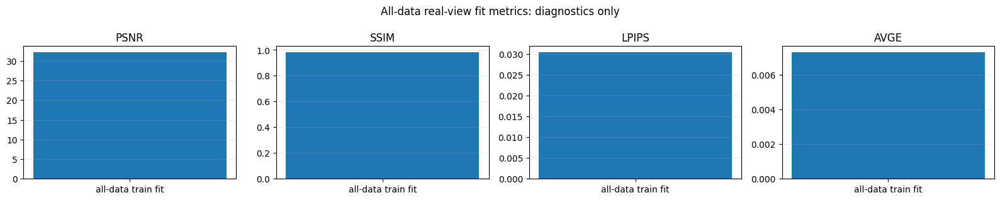

In [14]:
from skimage.metrics import structural_similarity as ssim_metric
import lpips, torch

lpips_fn = lpips.LPIPS(net='alex').cuda().eval()

def psnr_full(gt, pred):
    diff = (gt.astype(np.float32) / 255.0) - (pred.astype(np.float32) / 255.0)
    mse = float(np.mean(diff * diff))
    return -10 * np.log10(mse + 1e-8)

def ssim_full(gt, pred):
    return float(ssim_metric(gt, pred, channel_axis=2, data_range=255))

def lpips_full(gt, pred):
    def prep(x):
        t = torch.from_numpy(x.astype(np.float32) / 255.0).permute(2,0,1)[None].cuda()
        return t * 2 - 1
    with torch.no_grad():
        return float(lpips_fn(prep(gt), prep(pred)).item())

def avge_from_metrics(psnr, ssim, lpips_value):
    # BRUM-style unified score: geometric mean of MSE, DSSIM=(1-SSIM), and LPIPS.
    mse = 10 ** (-float(psnr) / 10.0)
    dssim = max(0.0, 1.0 - float(ssim))
    lp = max(0.0, float(lpips_value))
    return float((mse * dssim * lp) ** (1.0 / 3.0))

def find_render_for_gt(render_dir, gt_path, fallback_idx=None):
    candidates = list(render_dir.glob(gt_path.name)) or list(render_dir.glob(f'{gt_path.stem}*.png'))
    if candidates:
        return candidates[0]
    render_files = sorted(render_dir.glob('*.png'))
    assert fallback_idx is not None and fallback_idx < len(render_files), f'No render found for {gt_path.name}'
    return render_files[fallback_idx]

def compute_image_metrics(gt, pred):
    if pred.shape != gt.shape:
        pred = np.array(Image.fromarray(pred).resize((gt.shape[1], gt.shape[0]), Image.BILINEAR))
    psnr_v = psnr_full(gt, pred)
    ssim_v = ssim_full(gt, pred)
    lpips_v = lpips_full(gt, pred)
    avge_v = avge_from_metrics(psnr_v, ssim_v, lpips_v)
    return psnr_v, ssim_v, lpips_v, avge_v

rows = []
image_files = sorted((SCENE_ROOT / 'images').glob('*.png'))
for run in all_runs:
    model_dir = run['model_dir']
    it = run['iteration']
    render_dir = model_dir / 'train' / f'ours_{it}' / 'renders'
    assert render_dir.exists(), f'Missing render dir: {render_dir}'

    for idx, gt_path in enumerate(image_files):
        pred_path = find_render_for_gt(render_dir, gt_path, fallback_idx=idx)
        gt = np.array(Image.open(gt_path).convert('RGB'))
        pred = np.array(Image.open(pred_path).convert('RGB'))
        psnr_v, ssim_v, lpips_v, avge_v = compute_image_metrics(gt, pred)
        rows.append({
            'run': run['name'],
            'view_idx': idx,
            'view': views[idx],
            'is_test': False,
            'gt': gt_path.name,
            'pred': pred_path.name,
            'PSNR': psnr_v,
            'SSIM': ssim_v,
            'LPIPS': lpips_v,
            'AVGE': avge_v,
        })

df_train_fit = pd.DataFrame(rows)
print('All-data real-view fit metrics (training diagnostics only, not test metrics):')
display(df_train_fit)

summary_train_fit = df_train_fit[['PSNR', 'SSIM', 'LPIPS', 'AVGE']].agg(['mean', 'std'])
print('All-data real-view fit summary:')
display(summary_train_fit)

out_csv = EVAL_ROOT / 'all_data_real_view_fit_metrics_psnr_ssim_lpips_avge.csv'
df_train_fit.to_csv(out_csv, index=False)
summary_train_fit.to_csv(EVAL_ROOT / 'all_data_real_view_fit_metrics_summary.csv')
print('Saved:', out_csv)

fig, axes = plt.subplots(1, 4, figsize=(16, 3.2))
for ax, metric in zip(axes, ['PSNR', 'SSIM', 'LPIPS', 'AVGE']):
    ax.bar(['all-data train fit'], [summary_train_fit.loc['mean', metric]])
    ax.set_title(metric)
    ax.grid(axis='y', alpha=0.25)
plt.suptitle('All-data real-view fit metrics: diagnostics only')
plt.tight_layout()
out = DIAG_ROOT / 'all_data_real_view_fit_metrics.png'
fig.savefig(out, dpi=160, bbox_inches='tight')
print('Saved:', out)
plt.show()


## 11. Visualize real-view fits and error maps

These are training-view visual diagnostics, not held-out predictions.

Saved: /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/eval_brum_strict_v7_ALLDATA_BRUMLOSS/diagnostics/all_data_fit_view00_front.png


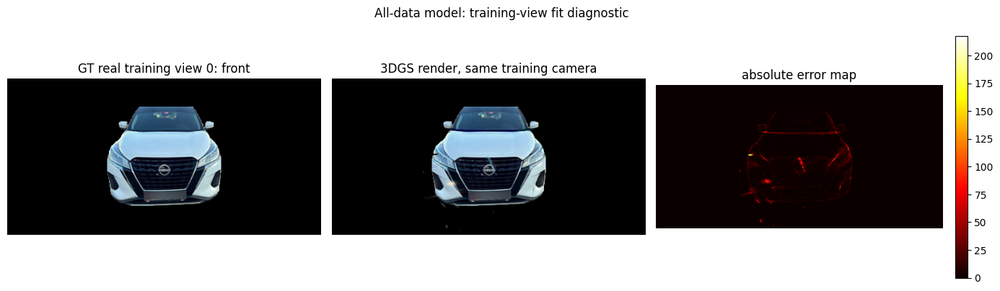

Saved: /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/eval_brum_strict_v7_ALLDATA_BRUMLOSS/diagnostics/all_data_fit_view01_front_left.png


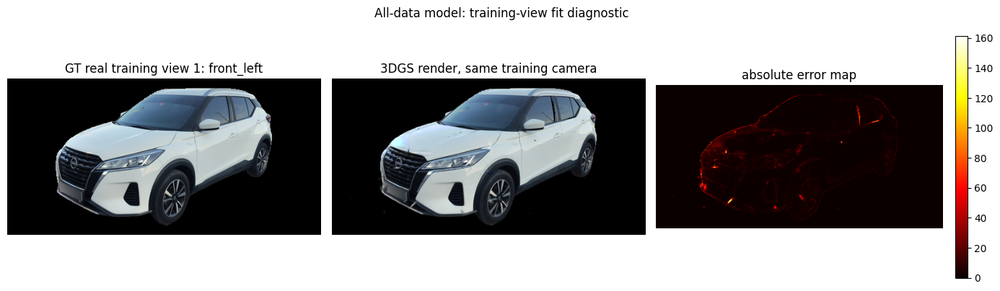

Saved: /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/eval_brum_strict_v7_ALLDATA_BRUMLOSS/diagnostics/all_data_fit_view02_side_left.png


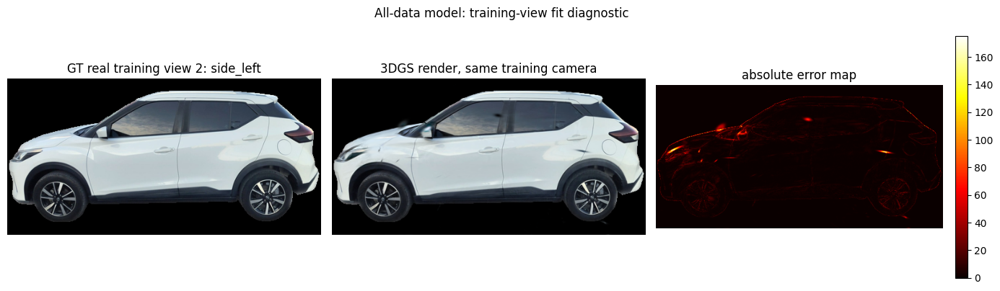

Saved: /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/eval_brum_strict_v7_ALLDATA_BRUMLOSS/diagnostics/all_data_fit_view03_rear_left.png


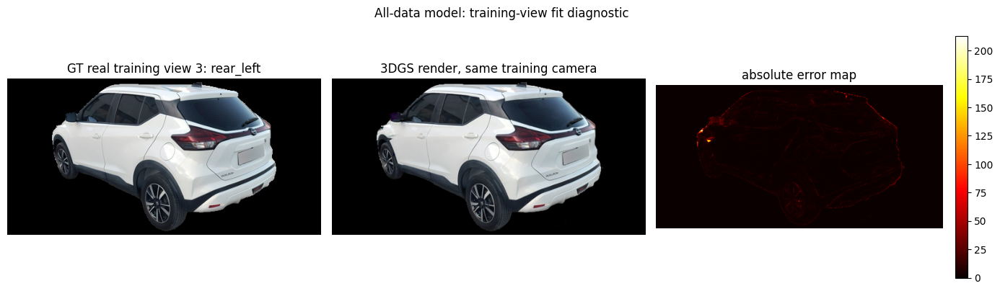

Saved: /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/eval_brum_strict_v7_ALLDATA_BRUMLOSS/diagnostics/all_data_fit_view04_rear.png


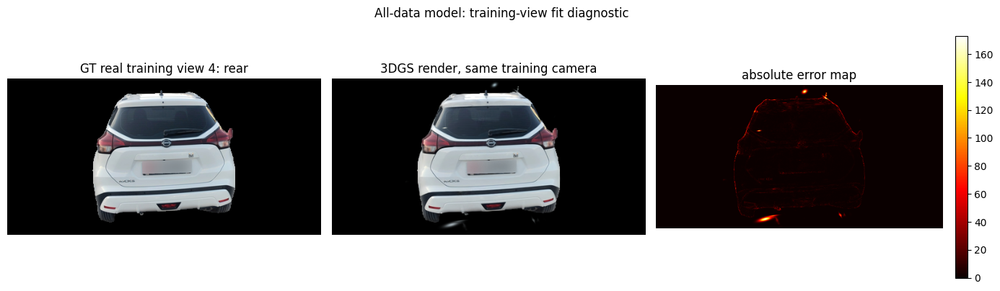

Saved: /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/eval_brum_strict_v7_ALLDATA_BRUMLOSS/diagnostics/all_data_fit_view05_rear_right.png


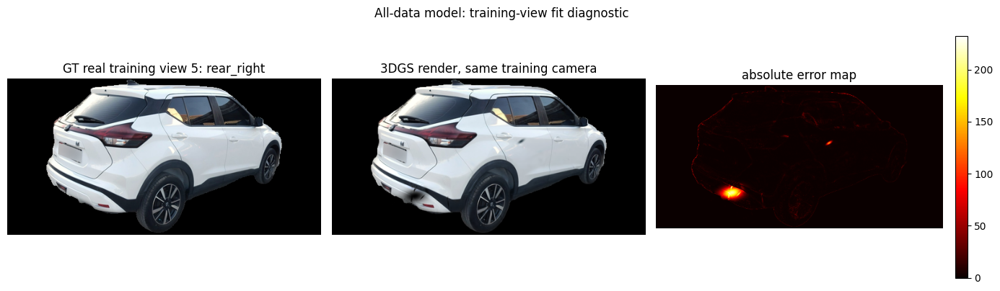

Saved: /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/eval_brum_strict_v7_ALLDATA_BRUMLOSS/diagnostics/all_data_fit_view06_side_right.png


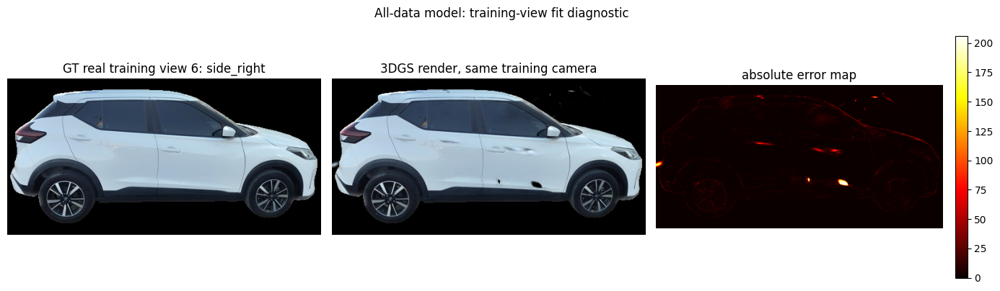

Saved: /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/eval_brum_strict_v7_ALLDATA_BRUMLOSS/diagnostics/all_data_fit_view07_front_right.png


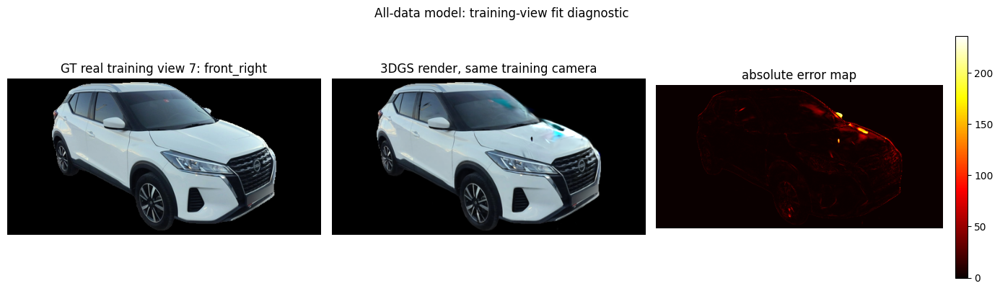

In [15]:
def show_all_data_real_view_fits(max_views=None):
    run = all_runs[0]
    model_dir = run['model_dir']
    it = run['iteration']
    render_dir = model_dir / 'train' / f'ours_{it}' / 'renders'
    image_files = sorted((SCENE_ROOT / 'images').glob('*.png'))
    if max_views is not None:
        image_files = image_files[:max_views]

    for idx, gt_path in enumerate(image_files):
        pred_path = find_render_for_gt(render_dir, gt_path, fallback_idx=idx)
        gt = np.array(Image.open(gt_path).convert('RGB'))
        pred = np.array(Image.open(pred_path).convert('RGB'))
        if pred.shape != gt.shape:
            pred = np.array(Image.fromarray(pred).resize((gt.shape[1], gt.shape[0]), Image.BILINEAR))
        err = np.abs(pred.astype(np.float32) - gt.astype(np.float32)).mean(axis=-1)
        fig, axes = plt.subplots(1, 3, figsize=(14, 4))
        axes[0].imshow(gt); axes[0].set_title(f'GT real training view {idx}: {views[idx]}'); axes[0].axis('off')
        axes[1].imshow(pred); axes[1].set_title('3DGS render, same training camera'); axes[1].axis('off')
        im = axes[2].imshow(err, cmap='hot'); axes[2].set_title('absolute error map'); axes[2].axis('off')
        plt.colorbar(im, ax=axes[2], fraction=0.046, pad=0.04)
        plt.suptitle('All-data model: training-view fit diagnostic')
        plt.tight_layout()
        out = DIAG_ROOT / f'all_data_fit_view{idx:02d}_{views[idx]}.png'
        fig.savefig(out, dpi=160, bbox_inches='tight')
        print('Saved:', out)
        plt.show()

show_all_data_real_view_fits(max_views=None)


In [19]:
GENERATED_MANIFEST = SCENE_ROOT / "generated_manifest_brum_soft_weighted.json"
ALLDATA_GEN_MANIFEST = GENERATED_MANIFEST

In [20]:
# ============================================================
# Render 3 augmented camera views + 3 random/interpolated views
# from the trained ALL-DATA BRUMLOSS model
# ============================================================

import os, json, random, subprocess, textwrap
from pathlib import Path

# Uses notebook variables:
# GS_REPO
# model_dir
# SCENE_ROOT
# GENERATED_MANIFEST / brum_manifest / manifest_path

AUG_RENDER_DIR = Path(model_dir) / "renders_augmented_plus_random"
AUG_RENDER_DIR.mkdir(parents=True, exist_ok=True)

# Pick manifest variable robustly
manifest_candidates = [
    globals().get("GENERATED_MANIFEST", None),
    globals().get("brum_manifest", None),
    globals().get("manifest_path", None),
    globals().get("TRAIN_GEN_MANIFEST", None),
    globals().get("ALLDATA_GEN_MANIFEST", None),
]

manifest_path = None
for m in manifest_candidates:
    if m is not None and Path(m).exists():
        manifest_path = Path(m)
        break

if manifest_path is None:
    raise RuntimeError("Could not find generated-view manifest variable.")

records = json.loads(manifest_path.read_text())
print("Loaded generated camera records:", len(records))
print("Manifest:", manifest_path)

# ------------------------------------------------------------
# 1. Select 3 existing augmented cameras
# ------------------------------------------------------------

aug_records = random.sample(records, min(3, len(records)))

aug_manifest = AUG_RENDER_DIR / "selected_3_augmented_manifest.json"
aug_manifest.write_text(json.dumps(aug_records, indent=2))

print("Selected augmented views:")
for r in aug_records:
    print(" ", Path(r["image_path"]).name)

# ------------------------------------------------------------
# 2. Select 3 random augmented-camera poses
#    Here "random" means random generated/interpolated camera
#    views from the available augmentation manifest.
# ------------------------------------------------------------

remaining = [r for r in records if r not in aug_records]
rand_records = random.sample(remaining, min(3, len(remaining)))

rand_manifest = AUG_RENDER_DIR / "selected_3_random_manifest.json"
rand_manifest.write_text(json.dumps(rand_records, indent=2))

print("Selected random views:")
for r in rand_records:
    print(" ", Path(r["image_path"]).name)

# ------------------------------------------------------------
# 3. Write a small render script using same GeneratedCamera logic
# ------------------------------------------------------------

RENDER_SELECTED_SCRIPT = Path(GS_REPO) / "render_selected_brum_views.py"

RENDER_SELECTED_SCRIPT.write_text(r"""
import sys, json
from pathlib import Path
from argparse import ArgumentParser
import numpy as np
from PIL import Image
import torch
import torch.nn.functional as F

from arguments import ModelParams, PipelineParams, get_combined_args
from scene import Scene, GaussianModel
from gaussian_renderer import render
from utils.graphics_utils import getWorld2View2, getProjectionMatrix, focal2fov
from utils.general_utils import safe_state


def load_u8_rgb(path):
    arr = np.asarray(Image.open(path).convert("RGB"), dtype=np.float32) / 255.0
    return torch.from_numpy(arr).permute(2, 0, 1).contiguous()


def save_rgb_tensor(img, path):
    img = img.detach().clamp(0, 1).cpu()
    arr = (img.permute(1, 2, 0).numpy() * 255).astype(np.uint8)
    Image.fromarray(arr).save(path)


class GeneratedCamera:
    def __init__(self, rec, data_device="cuda"):
        self.uid = int(rec.get("uid", 0))
        self.image_name = Path(rec.get("image_path", f"generated_{self.uid}.png")).stem
        self.colmap_id = -1
        self.data_device = data_device

        # image only used for width/height
        if "image_path" in rec and Path(rec["image_path"]).exists():
            img = load_u8_rgb(rec["image_path"])
            self.original_image = img.to(data_device)
            self.image_height = int(img.shape[1])
            self.image_width = int(img.shape[2])
        else:
            self.image_width = 512
            self.image_height = 256
            self.original_image = torch.zeros(3, 256, 512, device=data_device)

        K = np.asarray(rec["K"], dtype=np.float32)
        fx, fy = float(K[0, 0]), float(K[1, 1])

        self.FoVx = float(focal2fov(fx, self.image_width))
        self.FoVy = float(focal2fov(fy, self.image_height))

        P_w2c = np.asarray(rec["P_w2c"], dtype=np.float32)
        R_w2c = P_w2c[:3, :3]
        t_w2c = P_w2c[:3, 3]

        self.R = R_w2c.T
        self.T = t_w2c

        self.znear = 0.01
        self.zfar = 100.0
        self.trans = np.array([0.0, 0.0, 0.0], dtype=np.float32)
        self.scale = 1.0

        self.world_view_transform = torch.tensor(
            getWorld2View2(self.R, self.T, self.trans, self.scale),
            dtype=torch.float32,
        ).transpose(0, 1).to(data_device)

        self.projection_matrix = getProjectionMatrix(
            znear=self.znear,
            zfar=self.zfar,
            fovX=self.FoVx,
            fovY=self.FoVy,
        ).transpose(0, 1).to(data_device)

        self.full_proj_transform = (
            self.world_view_transform.unsqueeze(0)
            .bmm(self.projection_matrix.unsqueeze(0))
            .squeeze(0)
        )

        self.camera_center = self.world_view_transform.inverse()[3, :3]


def main():
    parser = ArgumentParser()
    lp = ModelParams(parser, sentinel=True)
    pp = PipelineParams(parser)

    parser.add_argument("--manifest", required=True)
    parser.add_argument("--iteration", type=int, default=-1)
    parser.add_argument("--out_dir", required=True)
    #parser.add_argument("--white_background", action="store_true", default=False)

    args = get_combined_args(parser)

    safe_state(False)

    dataset = lp.extract(args)
    pipe = pp.extract(args)

    gaussians = GaussianModel(dataset.sh_degree)
    scene = Scene(dataset, gaussians, load_iteration=args.iteration, shuffle=False)

    bg_color = [1, 1, 1] if dataset.white_background else [0, 0, 0]
    background = torch.tensor(bg_color, dtype=torch.float32, device="cuda")

    records = json.loads(Path(args.manifest).read_text())
    out_dir = Path(args.out_dir)
    out_dir.mkdir(parents=True, exist_ok=True)

    for idx, rec in enumerate(records):
        rec = dict(rec)
        rec["uid"] = idx
        cam = GeneratedCamera(rec, data_device="cuda")

        with torch.no_grad():
            pkg = render(cam, gaussians, pipe, background)
            img = pkg["render"]

        name = Path(rec.get("image_path", f"view_{idx:03d}.png")).stem
        save_rgb_tensor(img, out_dir / f"{idx:02d}_{name}_render.png")

    print("Saved renders to", out_dir)


if __name__ == "__main__":
    main()
""")

print("Wrote:", RENDER_SELECTED_SCRIPT)

# ------------------------------------------------------------
# 4. Run rendering for selected augmented + random views
# ------------------------------------------------------------

def run_render_selected(manifest, out_subdir):
    out_dir = AUG_RENDER_DIR / out_subdir
    out_dir.mkdir(parents=True, exist_ok=True)

    cmd = [
        "/usr/bin/python3",
        str(RENDER_SELECTED_SCRIPT),
        "-s", str(SCENE_ROOT),
        "-m", str(model_dir),
        "--manifest", str(manifest),
        "--iteration", "-1",
        "--out_dir", str(out_dir),
        "--images", "images",
        #"--disable_viewer",
    ]

    print("\nRunning:")
    print(" ".join(cmd))

    r = subprocess.run(
        cmd,
        cwd=str(GS_REPO),
        stdout=subprocess.PIPE,
        stderr=subprocess.STDOUT,
        text=True,
    )
    print(r.stdout)

    if r.returncode != 0:
        raise RuntimeError(f"Render command failed with code {r.returncode}")

    return out_dir

aug_out = run_render_selected(aug_manifest, "renders_3_augmented")
rand_out = run_render_selected(rand_manifest, "renders_3_random")

print("Augmented renders:", aug_out)
print("Random renders:", rand_out)

Loaded generated camera records: 64
Manifest: /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/scene_graphdeco_brum_strict_v7_slerp_depth/generated_manifest_brum_soft_weighted.json
Selected augmented views:
  src04_to03_prev_h080.png
  src07_to00_next_h080.png
  src01_to02_next_h075.png
Selected random views:
  src00_to07_prev_h075.png
  src04_to05_next_h025.png
  src01_to00_prev_h050.png
Wrote: /content/drive/MyDrive/ResearchProject/gaussian-splatting/render_selected_brum_views.py

Running:
/usr/bin/python3 /content/drive/MyDrive/ResearchProject/gaussian-splatting/render_selected_brum_views.py -s /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/scene_graphdeco_brum_strict_v7_slerp_depth -m /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/model_brum_strict_v7_ALLDATA_BRUMLOSS/all_data_no_test --manifest /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_

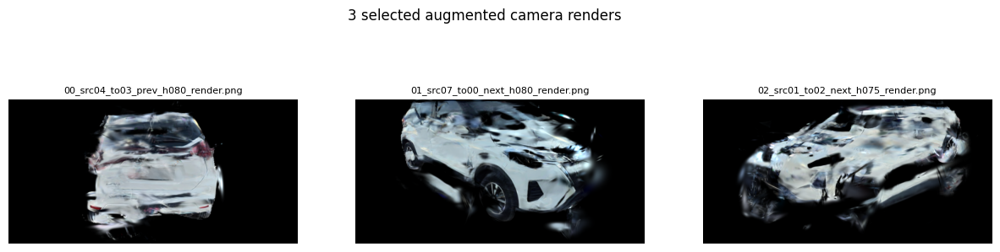

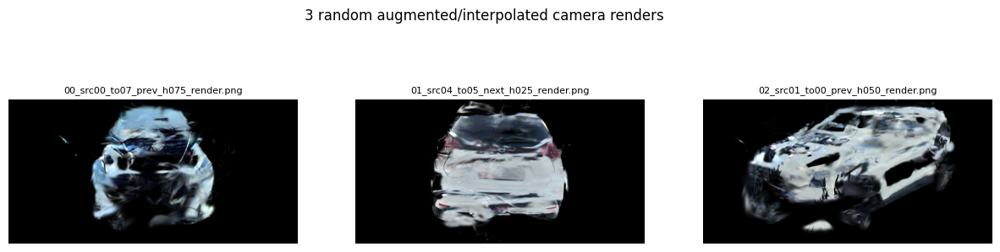

In [21]:
from PIL import Image
import matplotlib.pyplot as plt
from pathlib import Path

def show_folder(folder, title):
    paths = sorted(Path(folder).glob("*.png"))
    plt.figure(figsize=(15, 4))
    for i, p in enumerate(paths[:3]):
        plt.subplot(1, 3, i + 1)
        plt.imshow(Image.open(p))
        plt.title(p.name, fontsize=8)
        plt.axis("off")
    plt.suptitle(title)
    plt.show()

show_folder(aug_out, "3 selected augmented camera renders")
show_folder(rand_out, "3 random augmented/interpolated camera renders")

In [32]:
# ============================================================
# Render ALL 64 augmented views + ordered trajectory video
# real camera -> augmented views toward next camera -> next real camera
# ============================================================

from pathlib import Path
import json, re, subprocess
from PIL import Image
from IPython.display import Video, display

# ------------------------------------------------------------
# 1. Render all generated/augmented cameras
# ------------------------------------------------------------

AUG_RENDER_DIR = Path(model_dir) / "renders_augmented_plus_random"
AUG_RENDER_DIR.mkdir(parents=True, exist_ok=True)

# Find manifest
manifest_candidates = [
    globals().get("GENERATED_MANIFEST", None),
    globals().get("brum_manifest", None),
    globals().get("manifest_path", None),
    globals().get("TRAIN_GEN_MANIFEST", None),
    globals().get("ALLDATA_GEN_MANIFEST", None),
]

manifest_path = None
for m in manifest_candidates:
    if m is not None and Path(m).exists():
        manifest_path = Path(m)
        break

if manifest_path is None:
    raise RuntimeError("Could not find generated-view manifest variable.")

records = json.loads(Path(manifest_path).read_text())
print("Loaded generated records:", len(records))

all_aug_manifest = AUG_RENDER_DIR / "all_64_augmented_manifest.json"
all_aug_manifest.write_text(json.dumps(records, indent=2))

all_aug_out = run_render_selected(all_aug_manifest, "renders_all_64_augmented")
print("All augmented renders:", all_aug_out)

# ------------------------------------------------------------
# 2. Get real training-view renders
# ------------------------------------------------------------

run = all_runs[0]
it = run["iteration"]

real_render_dir = Path(run["model_dir"]) / "train" / f"ours_{it}" / "renders"
real_paths = sorted(real_render_dir.glob("*.png"))

if len(real_paths) == 0:
    raise RuntimeError(f"No real training renders found in {real_render_dir}")

print("Real renders:", len(real_paths))

# ------------------------------------------------------------
# 3. Get all augmented renders
# ------------------------------------------------------------

aug_paths = sorted(Path(all_aug_out).glob("*.png"))

if len(aug_paths) == 0:
    raise RuntimeError(f"No augmented renders found in {all_aug_out}")

print("Augmented renders:", len(aug_paths))

# ------------------------------------------------------------
# 4. Parse augmented filenames
# Expected names like:
# src00_to01_next_h025_render.png
# src00_to07_prev_h050_render.png
# ------------------------------------------------------------

pat = re.compile(r"src(\d+)_to(\d+)_(prev|next)_h(\d+)")

aug_by_pair = {}

for p in aug_paths:
    m = pat.search(p.name)
    if not m:
        print("Could not parse augmented filename:", p.name)
        continue

    src = int(m.group(1))
    dst = int(m.group(2))
    direction = m.group(3)
    h = int(m.group(4))

    aug_by_pair.setdefault((src, dst), []).append((h, p))

# Sort each pair by h ascending
for pair in aug_by_pair:
    aug_by_pair[pair] = [p for h, p in sorted(aug_by_pair[pair], key=lambda x: x[0])]

print("Parsed augmented directed pairs:", len(aug_by_pair))

# ------------------------------------------------------------
# 5. Build ordered camera trajectory
# Assumes real_paths order is camera index order 0..7.
# ------------------------------------------------------------

N = len(real_paths)

ordered = []

for i in range(N):
    j = (i + 1) % N

    # real camera i
    ordered.append(("real", i, real_paths[i]))

    # augmented cameras from i toward i+1
    if (i, j) in aug_by_pair:
        for p in aug_by_pair[(i, j)]:
            ordered.append(("aug", i, p))
    else:
        print(f"WARNING: missing augmented direction {i}->{j}")

print("Ordered unique images:", len(ordered))

# ------------------------------------------------------------
# 6. Write video frames
# ------------------------------------------------------------

VIDEO_DIR = Path(model_dir) / "video_ordered_full_augmented_trajectory"
FRAMES_DIR = VIDEO_DIR / "frames"

VIDEO_DIR.mkdir(parents=True, exist_ok=True)
FRAMES_DIR.mkdir(parents=True, exist_ok=True)

# clean old frames
for p in FRAMES_DIR.glob("frame_*.png"):
    p.unlink()

REPEAT_REAL = 14   # pause longer on real cameras
REPEAT_AUG = 3     # short hold on interpolated views
FPS = 12           # lower = slower

frame_idx = 0

for kind, idx, p in ordered:
    img = Image.open(p).convert("RGB")

    repeat = REPEAT_REAL if kind == "real" else REPEAT_AUG

    for _ in range(repeat):
        out = FRAMES_DIR / f"frame_{frame_idx:04d}.png"
        img.save(out)
        frame_idx += 1

print("Total video frames:", frame_idx)

# ------------------------------------------------------------
# 7. Create MP4
# ------------------------------------------------------------

mp4_path = VIDEO_DIR / "ordered_full_augmented_trajectory.mp4"

cmd = [
    "ffmpeg", "-y",
    "-framerate", str(FPS),
    "-i", str(FRAMES_DIR / "frame_%04d.png"),
    "-vf", "pad=ceil(iw/2)*2:ceil(ih/2)*2",
    "-c:v", "libx264",
    "-pix_fmt", "yuv420p",
    str(mp4_path),
]

print("Running ffmpeg:")
print(" ".join(cmd))

r = subprocess.run(
    cmd,
    stdout=subprocess.PIPE,
    stderr=subprocess.STDOUT,
    text=True,
)

print(r.stdout)

if r.returncode != 0:
    raise RuntimeError("ffmpeg failed")

print("Saved video:", mp4_path)

display(Video(str(mp4_path), embed=True, width=768))

Loaded generated records: 64

Running:
/usr/bin/python3 /content/drive/MyDrive/ResearchProject/gaussian-splatting/render_selected_brum_views.py -s /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/scene_graphdeco_brum_strict_v7_slerp_depth -m /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/model_brum_strict_v7_ALLDATA_BRUMLOSS/all_data_no_test --manifest /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/model_brum_strict_v7_ALLDATA_BRUMLOSS/all_data_no_test/renders_augmented_plus_random/all_64_augmented_manifest.json --iteration -1 --out_dir /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/model_brum_strict_v7_ALLDATA_BRUMLOSS/all_data_no_test/renders_augmented_plus_random/renders_all_64_augmented --images images
Looking for config file in /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_260047

In [36]:
from pathlib import Path
import numpy as np

def qvec2rotmat(qvec):
    qvec = np.asarray(qvec, dtype=np.float64)
    w, x, y, z = qvec
    return np.array([
        [1 - 2*y*y - 2*z*z,     2*x*y - 2*z*w,     2*x*z + 2*y*w],
        [    2*x*y + 2*z*w, 1 - 2*x*x - 2*z*z,     2*y*z - 2*x*w],
        [    2*x*z - 2*y*w,     2*y*z + 2*x*w, 1 - 2*x*x - 2*y*y],
    ], dtype=np.float32)


def parse_colmap_cameras_txt(path):
    cameras = {}

    for line in Path(path).read_text().splitlines():
        line = line.strip()
        if not line or line.startswith("#"):
            continue

        parts = line.split()
        cam_id = int(parts[0])
        model = parts[1]
        width = int(parts[2])
        height = int(parts[3])
        params = list(map(float, parts[4:]))

        if model in ["SIMPLE_PINHOLE", "SIMPLE_RADIAL", "RADIAL"]:
            f = params[0]
            cx = params[1]
            cy = params[2]
            fx = fy = f
        elif model in ["PINHOLE", "OPENCV", "OPENCV_FISHEYE"]:
            fx = params[0]
            fy = params[1]
            cx = params[2]
            cy = params[3]
        else:
            raise RuntimeError(f"Unsupported camera model: {model}")

        K = [
            [fx, 0.0, cx],
            [0.0, fy, cy],
            [0.0, 0.0, 1.0],
        ]

        cameras[cam_id] = {
            "model": model,
            "width": width,
            "height": height,
            "K": K,
        }

    return cameras


def parse_colmap_images_txt(path, cameras):
    real_records = []

    lines = Path(path).read_text().splitlines()
    i = 0

    while i < len(lines):
        line = lines[i].strip()

        if not line or line.startswith("#"):
            i += 1
            continue

        parts = line.split()

        image_id = int(parts[0])
        qvec = list(map(float, parts[1:5]))
        tvec = list(map(float, parts[5:8]))
        cam_id = int(parts[8])
        image_name = parts[9]

        R_w2c = qvec2rotmat(qvec)
        t_w2c = np.asarray(tvec, dtype=np.float32)

        P_w2c = np.eye(4, dtype=np.float32)
        P_w2c[:3, :3] = R_w2c
        P_w2c[:3, 3] = t_w2c

        cam = cameras[cam_id]

        real_records.append({
            "uid": len(real_records),
            "image_path": str(Path(SCENE_ROOT) / "images" / image_name),
            "K": cam["K"],
            "P_w2c": P_w2c.tolist(),
            "kind": "real_colmap",
            "image_name": image_name,
            "image_id": image_id,
            "camera_id": cam_id,
        })

        # skip 2D points line
        i += 2

    return real_records


cameras_txt = Path(SCENE_ROOT) / "sparse/0/cameras.txt"
images_txt = Path(SCENE_ROOT) / "sparse/0/images.txt"

colmap_cameras = parse_colmap_cameras_txt(cameras_txt)
real_records = parse_colmap_images_txt(images_txt, colmap_cameras)

real_records = sorted(real_records, key=lambda r: r["image_name"])

print("Parsed real records:", len(real_records))
for i, r in enumerate(real_records):
    print(i, r["image_name"])

Parsed real records: 8
0 real_00_front.png
1 real_01_front_left.png
2 real_02_side_left.png
3 real_03_rear_left.png
4 real_04_rear.png
5 real_05_rear_right.png
6 real_06_side_right.png
7 real_07_front_right.png


In [42]:
# ------------------------------------------------------------
# Build true 360 trajectory:
# real_i -> augmented i_to_i+1 -> real_i+1
# ------------------------------------------------------------

import numpy as np
from scipy.spatial.transform import Rotation as R, Slerp

INBETWEENS_PER_STEP = 6

# Parse augmented records by pair/direction/h
pat = re.compile(r"src(\d+)_to(\d+)_(prev|next)_h(\d+)")

aug_records_by_pair = {}

for rec in records:
    name = Path(rec["image_path"]).name
    m = pat.search(name)
    if not m:
        continue

    src = int(m.group(1))
    dst = int(m.group(2))
    direction = m.group(3)
    h = int(m.group(4))

    aug_records_by_pair.setdefault((src, dst, direction), []).append((h, rec))

for key in aug_records_by_pair:
    aug_records_by_pair[key] = [
        rec for h, rec in sorted(aug_records_by_pair[key], key=lambda x: x[0])
    ]


def w2c_to_c2w(P_w2c):
    P_w2c = np.asarray(P_w2c, dtype=np.float32)
    Rw2c = P_w2c[:3, :3]
    tw2c = P_w2c[:3, 3]

    P_c2w = np.eye(4, dtype=np.float32)
    P_c2w[:3, :3] = Rw2c.T
    P_c2w[:3, 3] = -Rw2c.T @ tw2c
    return P_c2w


def c2w_to_w2c(P_c2w):
    P_c2w = np.asarray(P_c2w, dtype=np.float32)
    Rc2w = P_c2w[:3, :3]
    tc2w = P_c2w[:3, 3]

    P_w2c = np.eye(4, dtype=np.float32)
    P_w2c[:3, :3] = Rc2w.T
    P_w2c[:3, 3] = -Rc2w.T @ tc2w
    return P_w2c


def interpolate_c2w(P0, P1, alpha):
    R0 = R.from_matrix(P0[:3, :3])
    R1 = R.from_matrix(P1[:3, :3])

    slerp = Slerp([0, 1], R.concatenate([R0, R1]))
    R_alpha = slerp([alpha]).as_matrix()[0]

    t_alpha = (1.0 - alpha) * P0[:3, 3] + alpha * P1[:3, 3]

    P = np.eye(4, dtype=np.float32)
    P[:3, :3] = R_alpha
    P[:3, 3] = t_alpha
    return P


# Build sparse 360 path using PREV bridges
# much smoother connection to real cameras

N = len(real_records)
pose_path = []

for i in range(N):
    j = (i + 1) % N

    pose_path.append({
        **real_records[i],
        "trajectory_kind": "real",
        "trajectory_index": len(pose_path),
    })

    # IMPORTANT:
    # use prev bridge from next camera back toward current
    key = (j, i, "prev")

    if key in aug_records_by_pair:
        chunk = aug_records_by_pair[key]

        # reverse so motion goes current real -> toward next real
        chunk = list(reversed(chunk))

        for rec in chunk:
            pose_path.append({
                **rec,
                "trajectory_kind": "aug_prev_reversed",
                "trajectory_index": len(pose_path),
            })
    else:
        print("Missing augmented bridge:", key)

# close loop
pose_path.append({
    **real_records[0],
    "trajectory_kind": "real_loop_close",
    "trajectory_index": len(pose_path),
})

print("Sparse 360 pose path:", len(pose_path))

for r in pose_path:
    print(
        r["trajectory_index"],
        r["trajectory_kind"],
        Path(r["image_path"]).name
    )


# Densify every adjacent pose, including real->aug and aug->real
dense_records = []

for idx in range(len(pose_path) - 1):
    rec0 = pose_path[idx]
    rec1 = pose_path[idx + 1]

    dense_records.append({
        **rec0,
        "uid": len(dense_records),
        "dense_kind": "trajectory_key_pose",
        "dense_segment": idx,
        "dense_alpha": 0.0,
    })

    P0 = w2c_to_c2w(rec0["P_w2c"])
    P1 = w2c_to_c2w(rec1["P_w2c"])

    for s in range(1, INBETWEENS_PER_STEP + 1):
        alpha = s / (INBETWEENS_PER_STEP + 1)
        P_interp_c2w = interpolate_c2w(P0, P1, alpha)
        P_interp_w2c = c2w_to_w2c(P_interp_c2w)

        dense_records.append({
            "uid": len(dense_records),
            "image_path": rec0["image_path"],
            "K": rec0["K"],
            "P_w2c": P_interp_w2c.tolist(),
            "dense_kind": "trajectory_interpolated",
            "dense_segment": idx,
            "dense_alpha": float(alpha),
        })

dense_records.append({
    **pose_path[-1],
    "uid": len(dense_records),
    "dense_kind": "trajectory_final",
    "dense_segment": len(pose_path) - 1,
    "dense_alpha": 0.0,
})

print("Dense 360 records:", len(dense_records))

Sparse 360 pose path: 41
0 real real_00_front.png
1 aug_prev_reversed src01_to00_prev_h080.png
2 aug_prev_reversed src01_to00_prev_h075.png
3 aug_prev_reversed src01_to00_prev_h050.png
4 aug_prev_reversed src01_to00_prev_h025.png
5 real real_01_front_left.png
6 aug_prev_reversed src02_to01_prev_h080.png
7 aug_prev_reversed src02_to01_prev_h075.png
8 aug_prev_reversed src02_to01_prev_h050.png
9 aug_prev_reversed src02_to01_prev_h025.png
10 real real_02_side_left.png
11 aug_prev_reversed src03_to02_prev_h080.png
12 aug_prev_reversed src03_to02_prev_h075.png
13 aug_prev_reversed src03_to02_prev_h050.png
14 aug_prev_reversed src03_to02_prev_h025.png
15 real real_03_rear_left.png
16 aug_prev_reversed src04_to03_prev_h080.png
17 aug_prev_reversed src04_to03_prev_h075.png
18 aug_prev_reversed src04_to03_prev_h050.png
19 aug_prev_reversed src04_to03_prev_h025.png
20 real real_04_rear.png
21 aug_prev_reversed src05_to04_prev_h080.png
22 aug_prev_reversed src05_to04_prev_h075.png
23 aug_prev_rev

In [43]:
# ------------------------------------------------------------
# Render dense 360 trajectory + build MP4
# ------------------------------------------------------------

from pathlib import Path
from PIL import Image
from IPython.display import Video, display
import json, subprocess

DENSE_360_DIR = Path(model_dir) / "video_dense_360_real_augmented"
DENSE_360_DIR.mkdir(parents=True, exist_ok=True)

dense_360_manifest = DENSE_360_DIR / "dense_360_real_augmented_manifest.json"
dense_360_manifest.write_text(json.dumps(dense_records, indent=2))

dense_360_render_dir = Path(model_dir) / "renders_augmented_plus_random" / "renders_dense_360_real_augmented"
dense_360_render_dir.mkdir(parents=True, exist_ok=True)

# clean old rendered frames
for p in dense_360_render_dir.glob("*.png"):
    p.unlink()

dense_360_out = run_render_selected(
    dense_360_manifest,
    "renders_dense_360_real_augmented"
)

print("Dense 360 renders:", dense_360_out)

# ------------------------------------------------------------
# Build ordered video frames
# ------------------------------------------------------------

render_paths = sorted(Path(dense_360_out).glob("*.png"))

if len(render_paths) == 0:
    raise RuntimeError("No dense 360 renders found.")

print("Rendered dense 360 frames:", len(render_paths))

FRAMES_DIR = DENSE_360_DIR / "frames"
FRAMES_DIR.mkdir(parents=True, exist_ok=True)

# clean old video frames
for p in FRAMES_DIR.glob("frame_*.png"):
    p.unlink()

FPS = 24
REPEAT_EACH = 1

frame_idx = 0

for p in render_paths:
    img = Image.open(p).convert("RGB")

    for _ in range(REPEAT_EACH):
        img.save(FRAMES_DIR / f"frame_{frame_idx:04d}.png")
        frame_idx += 1

print("Video frames:", frame_idx)

# ------------------------------------------------------------
# Create MP4
# ------------------------------------------------------------

mp4_path = DENSE_360_DIR / "dense_360_real_augmented.mp4"

cmd = [
    "ffmpeg", "-y",
    "-framerate", str(FPS),
    "-i", str(FRAMES_DIR / "frame_%04d.png"),
    "-vf", "pad=ceil(iw/2)*2:ceil(ih/2)*2",
    "-c:v", "libx264",
    "-pix_fmt", "yuv420p",
    str(mp4_path),
]

print("Running ffmpeg:")
print(" ".join(cmd))

r = subprocess.run(
    cmd,
    stdout=subprocess.PIPE,
    stderr=subprocess.STDOUT,
    text=True,
)

print(r.stdout)

if r.returncode != 0:
    raise RuntimeError("ffmpeg failed")

print("Saved dense 360 video:", mp4_path)
display(Video(str(mp4_path), embed=True, width=768))



Running:
/usr/bin/python3 /content/drive/MyDrive/ResearchProject/gaussian-splatting/render_selected_brum_views.py -s /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/scene_graphdeco_brum_strict_v7_slerp_depth -m /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/model_brum_strict_v7_ALLDATA_BRUMLOSS/all_data_no_test --manifest /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/model_brum_strict_v7_ALLDATA_BRUMLOSS/all_data_no_test/video_dense_360_real_augmented/dense_360_real_augmented_manifest.json --iteration -1 --out_dir /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/model_brum_strict_v7_ALLDATA_BRUMLOSS/all_data_no_test/renders_augmented_plus_random/renders_dense_360_real_augmented --images images
Looking for config file in /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/model_bru

In [41]:
def cam_center_from_rec(rec):
    P = np.asarray(rec["P_w2c"], dtype=np.float32)
    Rw2c = P[:3, :3]
    tw2c = P[:3, 3]
    return -Rw2c.T @ tw2c

centers = np.array([cam_center_from_rec(r) for r in pose_path])
dists = np.linalg.norm(centers[1:] - centers[:-1], axis=1)

print("pose_path step min/median/max:", dists.min(), np.median(dists), dists.max())

for i, d in enumerate(dists):
    if d > np.median(dists) * 3:
        print("BIG STEP", i, d)
        print(" from", pose_path[i]["trajectory_kind"], Path(pose_path[i]["image_path"]).name)
        print(" to  ", pose_path[i+1]["trajectory_kind"], Path(pose_path[i+1]["image_path"]).name)

pose_path step min/median/max: 0.00076272315 0.0048499773 0.1961386
BIG STEP 0 0.055660535
 from real real_00_front.png
 to   aug_next src00_to01_next_h025.png
BIG STEP 4 0.16263416
 from aug_next src00_to01_next_h080.png
 to   real real_01_front_left.png
BIG STEP 5 0.05630751
 from real real_01_front_left.png
 to   aug_next src01_to02_next_h025.png
BIG STEP 9 0.18662532
 from aug_next src01_to02_next_h080.png
 to   real real_02_side_left.png
BIG STEP 10 0.047148857
 from real real_02_side_left.png
 to   aug_next src02_to03_next_h025.png
BIG STEP 14 0.17747921
 from aug_next src02_to03_next_h080.png
 to   real real_03_rear_left.png
BIG STEP 15 0.031293627
 from real real_03_rear_left.png
 to   aug_next src03_to04_next_h025.png
BIG STEP 19 0.13944541
 from aug_next src03_to04_next_h080.png
 to   real real_04_rear.png
BIG STEP 20 0.0146673
 from real real_04_rear.png
 to   aug_next src04_to05_next_h025.png
BIG STEP 24 0.16229461
 from aug_next src04_to05_next_h080.png
 to   real real_05_

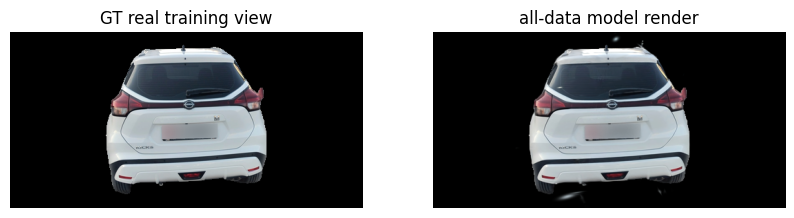

In [17]:
run = all_runs[0]
model_dir = run['model_dir']
it = run['iteration']
render_dir = model_dir / 'train' / f'ours_{it}' / 'renders'

image_files = sorted((SCENE_ROOT / 'images').glob('*.png'))
idx = 4

gt_path = image_files[idx]
pred_path = find_render_for_gt(render_dir, gt_path, fallback_idx=idx)

gt = np.array(Image.open(gt_path).convert('RGB'))
pred = np.array(Image.open(pred_path).convert('RGB'))

plt.figure(figsize=(10,4))
plt.subplot(1,2,1); plt.imshow(gt); plt.title('GT real training view'); plt.axis('off')
plt.subplot(1,2,2); plt.imshow(pred); plt.title('all-data model render'); plt.axis('off')
plt.show()


,iteration,ema_total_loss,real_loss,gen_weighted_l1_no_ssim,lambda_gen,use_real_masked_loss,use_generated_weight,run
45,4600,0.021046,0.007776,0.004775,1.0,False,True,all_data_no_test
46,4700,0.024290,0.009485,0.012755,1.0,False,True,all_data_no_test
47,4800,0.025571,0.009235,0.019697,1.0,False,True,all_data_no_test
48,4900,0.024045,0.006803,0.012335,1.0,False,True,all_data_no_test
49,5000,0.024393,0.010094,0.017709,1.0,False,True,all_data_no_test


Saved: /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/eval_brum_strict_v7_ALLDATA_BRUMLOSS/diagnostics/all_data_real_loss_over_training.png


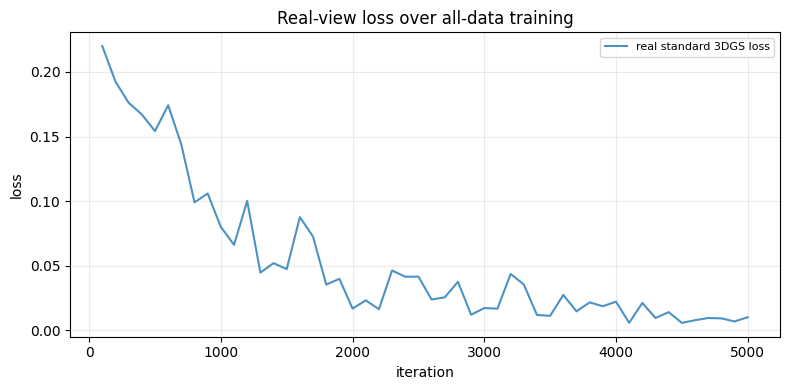

Saved: /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/eval_brum_strict_v7_ALLDATA_BRUMLOSS/diagnostics/all_data_generated_loss_over_training.png


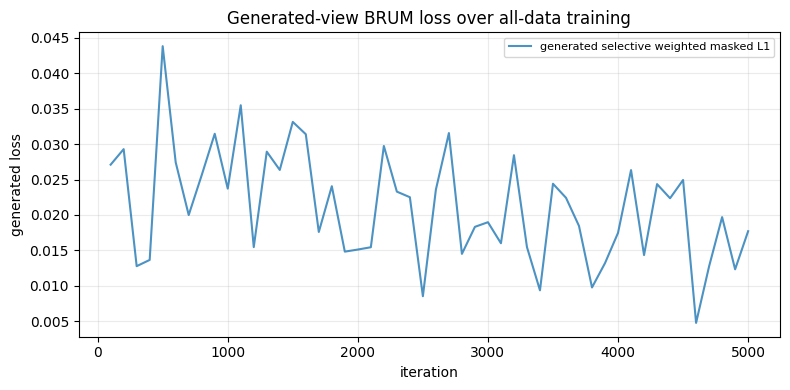

Done. Key outputs:
Scene root: /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/scene_graphdeco_brum_strict_v7_slerp_depth
Model     : /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/model_brum_strict_v7_ALLDATA_BRUMLOSS
Eval CSVs : /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/eval_brum_strict_v7_ALLDATA_BRUMLOSS
Diagnostics: /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/eval_brum_strict_v7_ALLDATA_BRUMLOSS/diagnostics


In [18]:
# ============================================================
# Final diagnostics: all-data training loss log
# ============================================================
loss_rows = []
for run in all_runs:
    log_path = run['model_dir'] / 'brum_training_loss_log.csv'
    if log_path.exists():
        df_log = pd.read_csv(log_path)
        df_log['run'] = run['name']
        loss_rows.append(df_log)

if loss_rows:
    df_loss = pd.concat(loss_rows, ignore_index=True)
    display(df_loss.tail())
    df_loss.to_csv(EVAL_ROOT / 'all_data_training_loss_log.csv', index=False)

    fig, ax = plt.subplots(figsize=(8, 4))
    ax.plot(df_loss['iteration'], df_loss['real_loss'], alpha=0.8, label='real standard 3DGS loss')
    ax.set_title('Real-view loss over all-data training')
    ax.set_xlabel('iteration')
    ax.set_ylabel('loss')
    ax.grid(alpha=0.25)
    ax.legend(fontsize=8)
    plt.tight_layout()
    out = DIAG_ROOT / 'all_data_real_loss_over_training.png'
    fig.savefig(out, dpi=160, bbox_inches='tight')
    print('Saved:', out)
    plt.show()

    fig, ax = plt.subplots(figsize=(8, 4))
    ax.plot(df_loss['iteration'], df_loss['gen_weighted_l1_no_ssim'], alpha=0.8, label='generated selective weighted masked L1')
    ax.set_title('Generated-view BRUM loss over all-data training')
    ax.set_xlabel('iteration')
    ax.set_ylabel('generated loss')
    ax.grid(alpha=0.25)
    ax.legend(fontsize=8)
    plt.tight_layout()
    out = DIAG_ROOT / 'all_data_generated_loss_over_training.png'
    fig.savefig(out, dpi=160, bbox_inches='tight')
    print('Saved:', out)
    plt.show()
else:
    print('No training loss CSV found yet. Run training cell first.')

print('Done. Key outputs:')
print('Scene root:', SCENE_ROOT)
print('Model     :', MODEL_ROOT)
print('Eval CSVs :', EVAL_ROOT)
print('Diagnostics:', DIAG_ROOT)
